In [1]:
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
from scipy.interpolate import interp1d
import matplotlib.cm as cm
from salishsea_tools import (nc_tools, gsw_calls, geo_tools, viz_tools, bathy_tools)
import seabird
import cmocean as cmo
import gsw
from seabird.cnv import fCNV
import pandas as pd
import seaborn as sns
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import AnchoredText
from mpl_toolkits.axes_grid1 import make_axes_locatable, axes_size

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
iso_NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/2013_short_slice_NEP36_along_isopycnal_larger_offshore_rho_correct.nc')

iso_spic = iso_NEP.variables['spiciness']
isot = iso_NEP.variables['isot']

vel_iso_NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/short_NEP36_2013_along_isopycnal_larger_offshore_velocities.nc')
u_vel_iso = vel_iso_NEP.variables['u_velocity']
v_vel_iso = vel_iso_NEP.variables['v_velocity']
isot_vel = vel_iso_NEP.variables['isot']

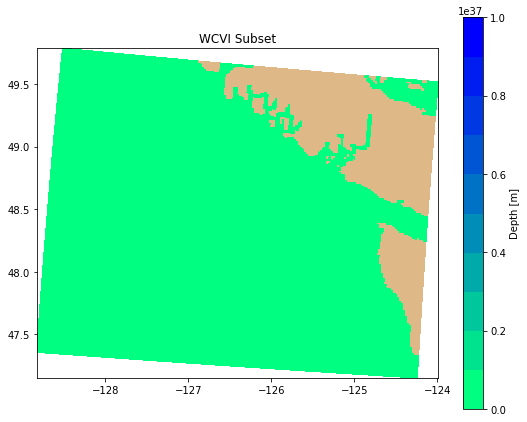

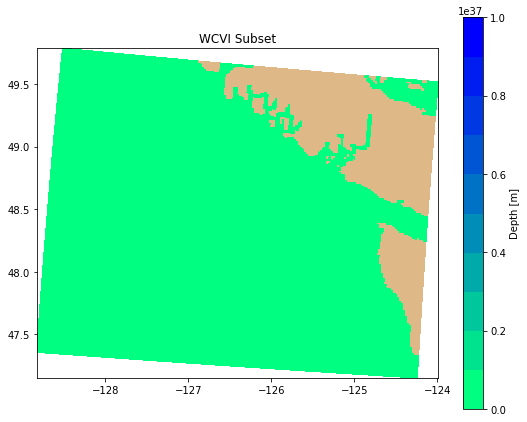

In [11]:
# bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

bathy = nc.Dataset('/data/ssahu/WCVI_sliced_bathy_NEP36_original.nc')


Z = bathy.variables['Bathymetry']

y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))

# z_wcvi = Z[y_wcvi_slice, x_wcvi_slice]
lon_wcvi = bathy['nav_lon']#[180:350, 480:650]
lat_wcvi = bathy['nav_lat']#[180:350, 480:650]


bathy_tools.plot_colourmesh(bathy, title = 'WCVI Subset', fig_size=(9, 9), axis_limits=None, colour_map='winter_r', bins=10, land_colour='burlywood')

In [147]:
Z.shape

(170, 170)

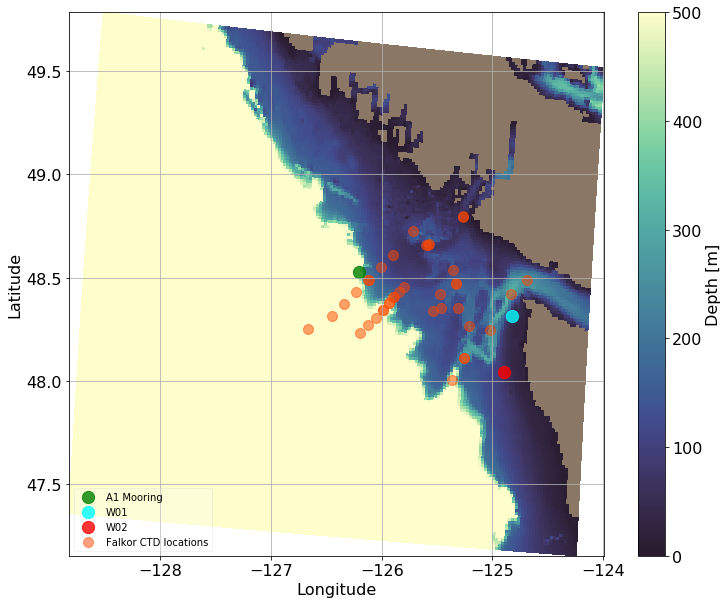

In [12]:
# bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


# Z = bathy.variables['Bathymetry']

# y_wcvi_slice = np.array(np.arange(180,350))
# x_wcvi_slice = np.array(np.arange(480,650))


# lon = bathy['nav_lon'][180:350, 480:650]
# lat = bathy['nav_lat'][180:350, 480:650]

# lon_model = bathy['nav_lon'][...]
# lat_model = bathy['nav_lat'][...]

y = np.empty_like(lat_location)
x = np.empty_like(lat_location)


# for i in np.arange(lat_location.shape[0]):
#     y[i], x[i] = geo_tools.find_closest_model_point(
#                lon_location[i],lat_location[i],lon_model,lat_model,tols={
#         'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    
# n = np.empty_like(lat_location)
# m = np.empty_like(lat_location)


# for i in np.arange(lat_location.shape[0]):
#     n[i], m[i] = geo_tools.find_closest_model_point(
#                lon_location[i],lat_location[i],lon,lat,tols={
#         'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

# y = y.astype(int)
# x = x.astype(int)

# n = n.astype(int)
# m = m.astype(int)

# cmap = plt.get_cmap('Blues_r')
cmap = cmo.cm.deep_r
# cmap.set_bad('burlywood')
cmap.set_bad('#8b7765')

fig, ax = plt.subplots(1, 1, figsize=(12,10)); ax.grid()

viz_tools.set_aspect(ax, coords='map', lats=lat_wcvi, adjustable='box-forced')

# bathy_tools.plot_colourmesh(bathy, title = 'WCVI Subset', fig_size=(9, 9), axis_limits=None, colour_map='winter_r', bins=15, land_colour='burlywood')
# p = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0, vmax=500)
p = ax.pcolormesh(lon_wcvi,lat_wcvi,Z, cmap=cmap, vmin=0, vmax=500)
cbar = fig.colorbar(p, ax=ax)
ax.set_aspect('auto')


# aspect = 20
# pad_fraction = 0.001
# divider = make_axes_locatable(ax)
# width = axes_size.AxesY(ax, aspect=1./aspect)
# pad = axes_size.Fraction(pad_fraction, width)
# cax = divider.append_axes("right", size=width, pad=pad)
# cbar = fig.colorbar(p, cax=cax)


for i in np.arange(lat_location.shape[0]):
    y[i], x[i] = geo_tools.find_closest_model_point(
               lon_location[i],lat_location[i],lon_wcvi,lat_wcvi,tols={
        'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
    
n = np.empty_like(lat_location)
m = np.empty_like(lat_location)


for i in np.arange(lat_location.shape[0]):
    n[i], m[i] = geo_tools.find_closest_model_point(
               lon_location[i],lat_location[i],lon_wcvi,lat_wcvi,tols={
        'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

y = y.astype(int)
x = x.astype(int)

n = n.astype(int)
m = m.astype(int)
# ax.scatter(x[:], y[:], c='orangered', s=100, alpha=0.5, label = 'Falkor CTD locations')

ax.set_xlabel('Longitude', fontsize=16)
ax.set_ylabel('Latitude', fontsize=16)
# ax.set_title('WCVI slice of NEP036 Model Domain', fontsize=20)

lon_W02 = -124.89500
lat_W02 = 48.04167

lon_W01 = -124.82500
lat_W01 = 48.31500

lon_A1 = -126.20433
lat_A1 = 48.52958

ax.scatter(lon_A1, lat_A1,  c='green', s=150, alpha=0.8, label = 'A1 Mooring')

ax.scatter(lon_W01, lat_W01, c='cyan', s=150, alpha=0.8, label = 'W01')

ax.scatter(lon_W02, lat_W02, c='red', s=150, alpha=0.8, label = 'W02')

ax.scatter(lon_location[:], lat_location[:], c='orangered', s=100, alpha=0.5, label = 'Falkor CTD locations')

legend = ax.legend(loc='lower left', fancybox=True, framealpha=0.25)

# ax.set_xlabel('x_index')
# ax.set_ylabel('y_index')
# ax.set_title('WCVI slice of NEP036 Model Domain', fontsize=20)

# viz_tools.plot_land_mask(ax, bathy)#, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
# cbar = fig.colorbar(p, cax=ax)
cbar.ax.set_ylabel('Depth [m]', fontsize=16)
ax.tick_params(axis='both',labelsize =16)
cbar.ax.tick_params(labelsize=16) 
ax.grid()


# lon_W01 = -124.82500
# lat_W01 = 48.31500

# j, i = geo_tools.find_closest_model_point(lon_W01,lat_W01,\
#                                           lon_model,lat_model,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})      
# ax.scatter(i, j, c='cyan', s=150, alpha=0.8, label = 'W01')

# lon_W02 = -124.89500
# lat_W02 = 48.04167

# y, x = geo_tools.find_closest_model_point(lon_W02,lat_W02,\
#                                           lon_model,lat_model,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
# ax.scatter(x, y, c='red', s=150, alpha=0.8, label = 'W02')

# lon_A1 = -126.20433
# lat_A1 = 48.52958

# j, i = geo_tools.find_closest_model_point(lon_A1,lat_A1,\
#                                           lon_model,lat_model,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 
# ax.scatter(i, j, c='green', s=150, alpha=0.8, label = 'A1 Mooring')


# legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

# plt.tight_layout(pad=0, w_pad=0, h_pad=0)

path_to_save = '/home/ssahu/saurav/NEP36_Model_Eval_plots/'
plt.savefig(path_to_save + 'Domain.png')

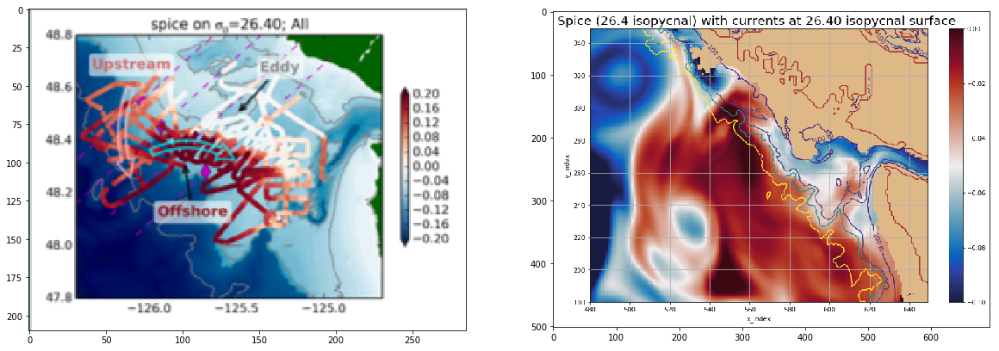

In [56]:
import matplotlib.image as mpimg

img1 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/Jody_Poster.png')
img2 = mpimg.imread('/home/ssahu/saurav/3D_images_for_video_spice/26.4_surface_spice_Falkor.png')


figure, ax = plt.subplots(1, 2, figsize=(20,20));
plt.figure(1)
plt.subplot(121)
plt.imshow(img1)

plt.subplot(122)
plt.imshow(img2)
plt.show()

In [ ]:
def plot_isopycnal_spice(t1, t2, iso_level):
    

    val_iso = iso_spic[t1:t2,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    val_iso = np.mean(val_iso, axis=0)




#     u_week = u_vel_iso[t1:t2,iso_level,:,:]
#     v_week = v_vel_iso[t1:t2,iso_level,:,:]


#     u_mean = np.mean(u_week, axis=0)
#     v_mean = np.mean(v_week, axis=0)
#     arrow_step = 5




    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))


    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

#     y = np.empty_like(lat_location)
#     x = np.empty_like(lat_location)


#     for i in np.arange(lat_location.shape[0]):
#         y[i], x[i] = geo_tools.find_closest_model_point(
#                    lon_location[i],lat_location[i],lon_model,lat_model,tols={
#             'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

#     n = np.empty_like(lat_location)
#     m = np.empty_like(lat_location)


#     for i in np.arange(lat_location.shape[0]):
#         n[i], m[i] = geo_tools.find_closest_model_point(
#                    lon_location[i],lat_location[i],lon,lat,tols={
#             'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

#     y = y.astype(int)
#     x = x.astype(int)

#     n = n.astype(int)
#     m = m.astype(int)

    # cmap = plt.get_cmap('Blues')
    cmap = plt.get_cmap(cmo.cm.balance)


    cmap.set_bad('burlywood')
    fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
    # p = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0, vmax=1000)
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500, 1000])
#     CS = ax.contour(x_wcvi_slice,y_wcvi_slice,depth_rho_0, levels =[0, 100, 200, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin=-0.1, vmax=0)
    cbar = fig.colorbar(q, ax=ax)

#     u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[...], v_mean[...])
#     u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level_of_currents,1:,1:,])
#     v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level_of_currents,1:,1:])
    speeds = np.sqrt(np.square(u_mean) + np.square(v_mean))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_mean[::arrow_step,::arrow_step], v_mean[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)


    # ax.scatter(x[:], y[:], c='orangered', s=100, alpha=0.6, label = 'Closest Falkor Points')
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index')
    ax.set_ylabel('y_index')
    ax.set_title('Spice (26.4 isopycnal) with currents at {d:.2f} isopycnal surface '.format(d = isot[iso_level]), fontsize=20)

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    # cbar = fig.colorbar(p, ax=ax)
    # cbar.ax.set_ylabel('Depth [m]', fontsize=20)
    ax.grid()


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


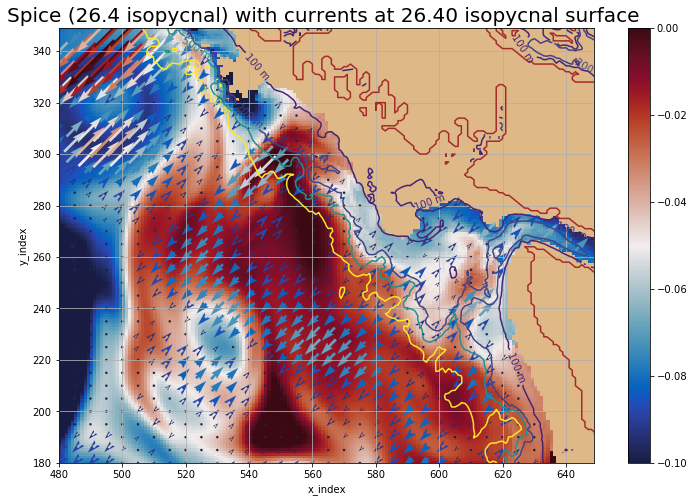

In [50]:
# level_of_currents = 0
t1 =112
t2 =123
iso_level = 4


plot_isopycnal_spice(t1, t2, iso_level)

In [64]:
NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_2013_T_S_Spice_larger_offshore_rho_correct.nc')


sal = NEP.variables['vosaline']
temp = NEP.variables['votemper']
spic = NEP.variables['spiciness']
rho = NEP.variables['density']

zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]





mask = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/mesh_mask.nc')

tmask = mask.variables['tmask'][0,:32,180:350, 480:650]
umask = mask.variables['umask'][0,:32,180:350, 480:650]
vmask = mask.variables['vmask'][0,:32,180:350, 480:650]
mbathy = mask.variables['mbathy'][0,180:350, 480:650]


y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))



In [4]:
NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_T_S_Spice_2013_Improved_temp_correction.nc')


sal = NEP.variables['vosaline']
temp = NEP.variables['votemper']
spic = NEP.variables['spiciness']
# rho = NEP.variables['density']

zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]





mask = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/mesh_mask.nc')

tmask = mask.variables['tmask'][0,:32,180:350, 480:650]
umask = mask.variables['umask'][0,:32,180:350, 480:650]
vmask = mask.variables['vmask'][0,:32,180:350, 480:650]
mbathy = mask.variables['mbathy'][0,180:350, 480:650]


y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))



In [5]:
sal_week = sal[112:123,:,:,:]
temp_week = temp[112:123,:,:,:]
spic_week = spic[112:123,:,:,:]
rho_week = spic[112:123,:,:,:]

sal_mean = np.mean(sal_week, axis=0)
temp_mean = np.mean(temp_week, axis=0)
spic_mean = np.mean(spic_week, axis=0)
rho_mean  = np.mean(rho_week, axis=0)


In [ ]:
def U_timeseries_at_WCVI_locations(grid_U):
    
    u_vel = grid_U.variables['uo'][:,:,1:,1:]

    
    vector_u = namedtuple('vector_u', 'u_vel')

    return vector_u(u_vel)


def V_timeseries_at_WCVI_locations(grid_V):
    
    v_vel = grid_V.variables['vo'][:,:,1:,1:]

    
    vector_v = namedtuple('vector_v', 'v_vel')

    return vector_v(v_vel)

In [ ]:
from __future__ import division
import glob
import os
import fnmatch
from collections import namedtuple, OrderedDict

import os


u_vel = np.empty((180,zlevels.shape[0],y_wcvi_slice.shape[0],x_wcvi_slice.shape[0]))
v_vel = np.empty((180,zlevels.shape[0],y_wcvi_slice.shape[0],x_wcvi_slice.shape[0]))



i = 0

for file in sorted(glob.glob('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d*grid_U*.nc')):
    vector_u = U_timeseries_at_WCVI_locations(nc.Dataset(file))
    u_vel[i:i+10,...] = vector_u[0]
    i = i+10

j = 0
for file in sorted(glob.glob('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d*grid_V*.nc')):
    vector_v = V_timeseries_at_WCVI_locations(nc.Dataset(file))
    v_vel[j:j+10,...] = vector_v[0]
    j = j+10
    

In [ ]:
def plot_isopycnal_spice(level_of_currents, t1, t2, iso_level):
    

    val_iso = iso_spic[t1:t2,iso_level,...]
    val_iso[np.isnan(val_iso)] = 0
    val_iso = np.ma.masked_equal(val_iso, value=0)
    val_iso = np.mean(val_iso, axis=0)




    u_week = u_vel[t1:t2,level_of_currents,:,:]
    v_week = v_vel[t1:t2,level_of_currents,:,:]


    u_mean = np.mean(u_week, axis=0)
    v_mean = np.mean(v_week, axis=0)
    arrow_step = 5




    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')


    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))


    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

#     y = np.empty_like(lat_location)
#     x = np.empty_like(lat_location)


#     for i in np.arange(lat_location.shape[0]):
#         y[i], x[i] = geo_tools.find_closest_model_point(
#                    lon_location[i],lat_location[i],lon_model,lat_model,tols={
#             'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

#     n = np.empty_like(lat_location)
#     m = np.empty_like(lat_location)


#     for i in np.arange(lat_location.shape[0]):
#         n[i], m[i] = geo_tools.find_closest_model_point(
#                    lon_location[i],lat_location[i],lon,lat,tols={
#             'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

#     y = y.astype(int)
#     x = x.astype(int)

#     n = n.astype(int)
#     m = m.astype(int)

    # cmap = plt.get_cmap('Blues')
    cmap = plt.get_cmap(cmo.cm.balance)


    cmap.set_bad('burlywood')
    fig, ax = plt.subplots(1, 1, figsize=(12,8)); ax.grid()
    # p = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], cmap=cmap, vmin=0, vmax=1000)
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500, 1000])
#     CS = ax.contour(x_wcvi_slice,y_wcvi_slice,depth_rho_0, levels =[0, 100, 200, 1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=10)

    q = ax.pcolormesh(x_wcvi_slice, y_wcvi_slice, val_iso[:], cmap=cmap, vmin=-0.1, vmax=0)
    cbar = fig.colorbar(q, ax=ax)

    u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[...], v_mean[...])
    u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level_of_currents,1:,1:,])
    v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level_of_currents,1:,1:])
    speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
    quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)


    # ax.scatter(x[:], y[:], c='orangered', s=100, alpha=0.6, label = 'Closest Falkor Points')
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)

    ax.set_xlabel('x_index')
    ax.set_ylabel('y_index')
    ax.set_title('Spice (26.4 isopycnal) with currents at {d:.2f}m '.format(d = zlevels[level_of_currents]), fontsize=20)

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    # cbar = fig.colorbar(p, ax=ax)
    # cbar.ax.set_ylabel('Depth [m]', fontsize=20)
    ax.grid()


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


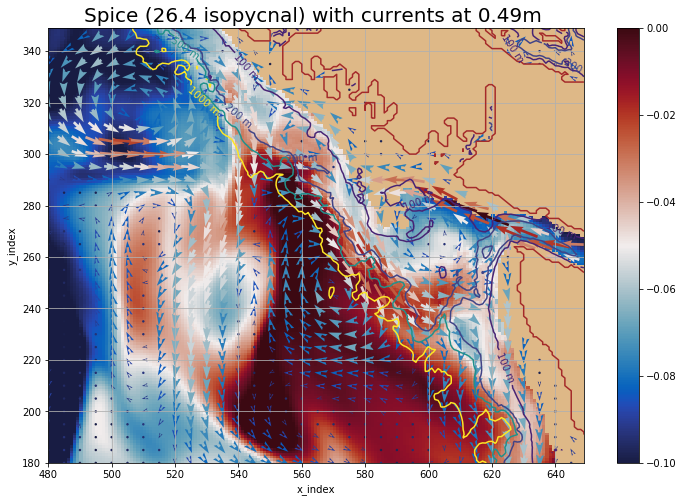

In [45]:
level_of_currents = 0
t1 =90
t2 =120
iso_level = 4


plot_isopycnal_spice(level_of_currents, t1, t2, iso_level)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


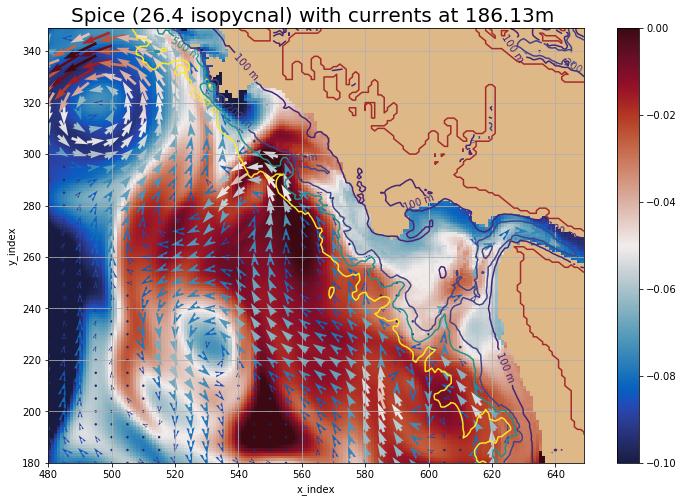

In [46]:
level_of_currents = 25
t1 =112
t2 =123
iso_level = 4


plot_isopycnal_spice(level_of_currents, t1, t2, iso_level)

In [6]:
def falkor_locations(profile):

    pressure = profile['PRES'][:]
    PT = profile['potemperature'][:]
    T = profile['TEMP'][:]
    SP = profile['PSAL'][:]
    lat = np.nanmean(profile['LATITUDE'][:])
    lon = np.nanmean(profile['LONGITUDE'][:])
    
    z = gsw.z_from_p(-pressure, lat)
    
    falkor_scalar_ts = namedtuple('falkor_scalar_ts', 'temp, sal, lat, lon, z')

    return falkor_scalar_ts(PT, SP, lat, lon, z)

In [7]:
from __future__ import division
import glob
import os
import fnmatch
from collections import namedtuple, OrderedDict

import os


file = []

i = 0
for file_number in sorted(glob.glob('/home/ssahu/saurav/Falkor_code/*.cnv')):
    
    file.append(file_number)
    
    i = i+1


In [8]:
temp_location = []
sal_location = []
lat_location = []
lon_location = []
z_location = []
# sal_location[j,:] = falkor_scalar_ts[1]
# lat_location[j] = falkor_scalar_ts[2]
# lon_location[j] = falkor_scalar_ts[3]


time_location = []

for example in file:
    time_location = np.append(arr= time_location, values= example[51:-4])
    
time_location = time_location.astype(int)
time_location[:] = time_location[:] + 93 

for j in np.arange(len(file)):

    falkor_scalar_ts = falkor_locations(fCNV(file[j]))
    
    
    temp_that_file = np.empty(falkor_scalar_ts[0].shape)
    temp_that_file = falkor_scalar_ts[0]
    temp_location.append(temp_that_file)
    
    sal_that_file = np.empty(falkor_scalar_ts[1].shape)
    sal_that_file = falkor_scalar_ts[1]
    sal_location.append(sal_that_file)
    
    
    z_that_file = np.empty(falkor_scalar_ts[4].shape)
    z_that_file = falkor_scalar_ts[4]
    z_location.append(z_that_file)    
    
    lat_that_file = np.empty(falkor_scalar_ts[2].shape)
    lat_that_file = falkor_scalar_ts[2]
    lat_location.append(lat_that_file)
    
    lon_that_file = np.empty(falkor_scalar_ts[3].shape)
    lon_that_file = falkor_scalar_ts[3]
    lon_location.append(lon_that_file)
    
    
    

    
temp_location = np.array(temp_location)
sal_location = np.array(sal_location)
z_location = np.array(z_location)
lat_location = np.array(lat_location)
lon_location = np.array(lon_location)



DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD002_20130819.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD003_20130819.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD004_20130819.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD005_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD006_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD007_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD008_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD009_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD010_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD011_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD012_20130820.cnv
DEBUG:root:Openning file: /home/ssahu/saurav/Falkor_code/FK009A_CTD013_20130

In [9]:
SA_falk_loc = np.empty_like(sal_location)
CT_falk_loc = np.empty_like(temp_location)
pressure_falk_loc = np.empty_like(z_location)
spic_falk_loc = np.empty_like(sal_location)


for i in np.arange(lat_location.shape[0]):
    
    pressure_falk_loc[i] = gsw.p_from_z(-z_location[i],lat_location[i])
    
    SA_falk_loc[i] = gsw.SA_from_SP(sal_location[i], pressure_falk_loc[i], lon_location[i], lat_location[i])
    
    CT_falk_loc[i] = gsw.CT_from_pt(sal_location[i], temp_location[i])
    
    spic_falk_loc[i] = gsw.spiciness0(SA_falk_loc[i], CT_falk_loc[i])

    

In [10]:
def plot_spic_subplot(level, ax, cmin, cmax):
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))

    arrow_step = 7
    y_slice_a = y_wcvi_slice[::arrow_step]
    x_slice_a = x_wcvi_slice[::arrow_step]



    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})


    spic_tzyx = spic_mean[level,...]
    spic_tzyx = np.ma.masked_array(spic_tzyx, mask= 1- tmask[level,...])

#     tra_tzyx = tracer_mean[level,...]
#     tra_tzyx = np.ma.masked_array(tra_tzyx, mask= 1- tmask[level,...])


    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice, spic_tzyx, cmap=cmap, norm = norm, vmin = cmin, vmax = cmax)

    value = zlevels[level]
    tol = 0.5
    for file_number in np.arange(len(file)):
        for i in np.arange(z_location[file_number].shape[0]):
            idx = (z_location[file_number][i] <= value+tol ) & (z_location[file_number][i] >= value-tol)
            if idx == True:
                spic_falkor_depth = spic_falk_loc[file_number][i]
                ax.scatter(x[file_number], y[file_number], c = spic_falkor_depth, norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=500, alpha=0.5,edgecolor= 'cyan' )#, label = 'Closest Falkor Points')


#     u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[level,...], v_mean[level,...])
#     u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level,1:,1:,])
#     v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level,1:,1:])
#     speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
#     quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    ax.set_xlabel('x Index',fontsize=18)
    ax.set_ylabel('y Index',fontsize=18)
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500], colors = 'white')
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=18, color = 'white')
    


    ax.set_title('depth \u2248 {d:.2f} m'.format(d=zlevels[level], z=zlevels),fontsize=18)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)
    ax.tick_params(axis='both',labelsize =18)
    ax.grid()
    return ax, mesh

def plot_temp_subplot(level, ax, cmin, cmax):
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))

    arrow_step = 7
    y_slice_a = y_wcvi_slice[::arrow_step]
    x_slice_a = x_wcvi_slice[::arrow_step]



    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})



    temp_tzyx = temp_mean[level,...]
    temp_tzyx = np.ma.masked_array(temp_tzyx, mask= 1- tmask[level,...])



    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice, temp_tzyx, cmap=cmap, norm = norm, vmin = cmin, vmax = cmax)

    value = zlevels[level]
    tol = 0.5
    for file_number in np.arange(len(file)):
        for i in np.arange(z_location[file_number].shape[0]):
            idx = (z_location[file_number][i] <= value+tol ) & (z_location[file_number][i] >= value-tol)
            if idx == True:
                temp_falkor_depth = temp_location[file_number][i]
                ax.scatter(x[file_number], y[file_number], c = temp_falkor_depth, norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=500, alpha=0.5, edgecolor= 'cyan')#, label = 'Closest Falkor Points')


#     u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[level,...], v_mean[level,...])
#     u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level,1:,1:,])
#     v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level,1:,1:])
#     speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
#     quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    ax.set_xlabel('x Index',fontsize=18)
    ax.set_ylabel('y Index',fontsize=18)


    ax.set_title('depth \u2248 {d:.2f} m'.format(d=zlevels[level], z=zlevels),fontsize=18)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500], colors = 'white')
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=18, color = 'white')
    ax.tick_params(axis='both',labelsize =18)
    ax.grid()
    return ax, mesh


def plot_sal_subplot(level, ax, cmin, cmax):
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))

    arrow_step = 7
    y_slice_a = y_wcvi_slice[::arrow_step]
    x_slice_a = x_wcvi_slice[::arrow_step]



    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})



    sal_tzyx = sal_mean[level,...]
    sal_tzyx = np.ma.masked_array(sal_tzyx, mask= 1- tmask[level,...])



    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice, sal_tzyx, cmap=cmap, norm = norm, vmin = cmin, vmax = cmax)

    value = zlevels[level]
    tol = 0.5
    for file_number in np.arange(len(file)):
        for i in np.arange(z_location[file_number].shape[0]):
            idx = (z_location[file_number][i] <= value+tol ) & (z_location[file_number][i] >= value-tol)
            if idx == True:
                sal_falkor_depth = sal_location[file_number][i]
                ax.scatter(x[file_number], y[file_number], c = sal_falkor_depth, norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=500, alpha=0.5,edgecolor='cyan')#, label = 'Closest Falkor Points')


#     u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[level,...], v_mean[level,...])
#     u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level,1:,1:,])
#     v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level,1:,1:])
#     speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
#     quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    ax.set_xlabel('x Index',fontsize=18)
    ax.set_ylabel('y Index',fontsize=18)

    ax.tick_params(axis='both',labelsize =18)
    ax.set_title('depth \u2248 {d:.2f} m'.format(d=zlevels[level], z=zlevels),fontsize=18)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0, 100, 200, 500], colors = 'white')
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=18, color = 'white')
    ax.grid()
    return ax, mesh







/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


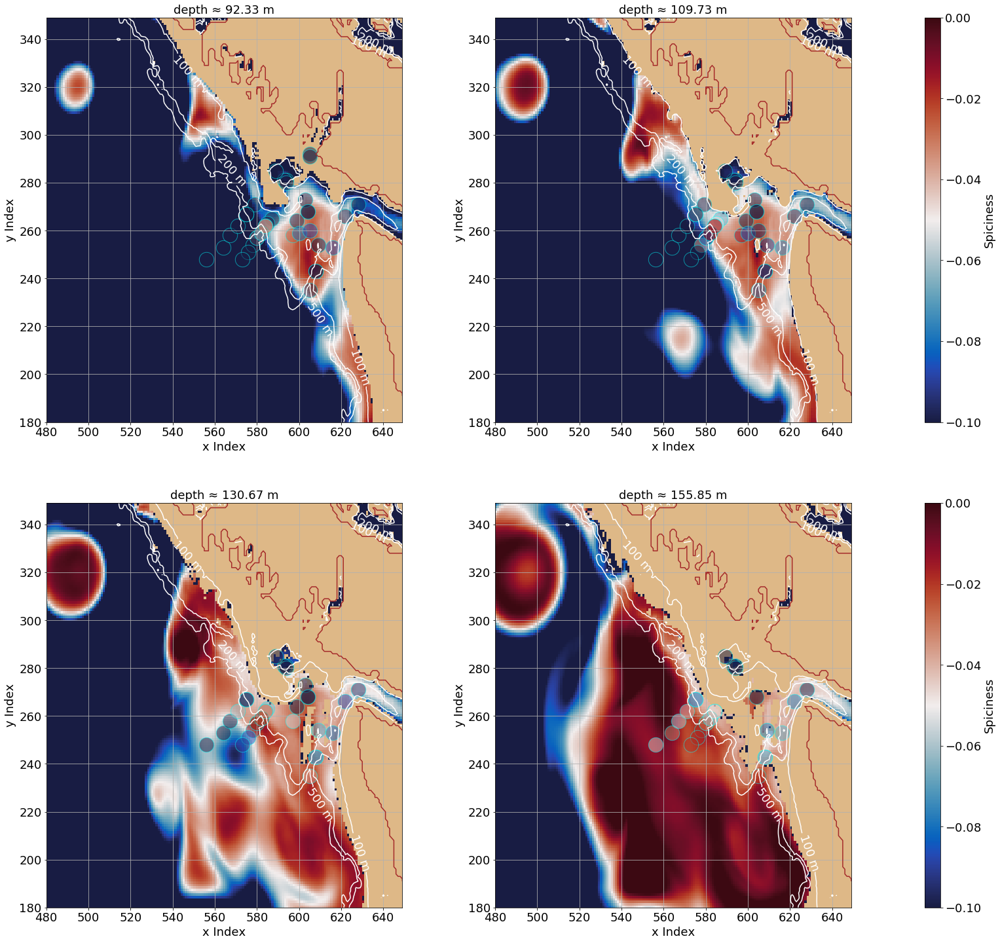

In [25]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=1, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 21, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 22, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_spic_subplot(level= 23, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 24, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

plt.savefig(path_to_save + 'spice_old_sub_1.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


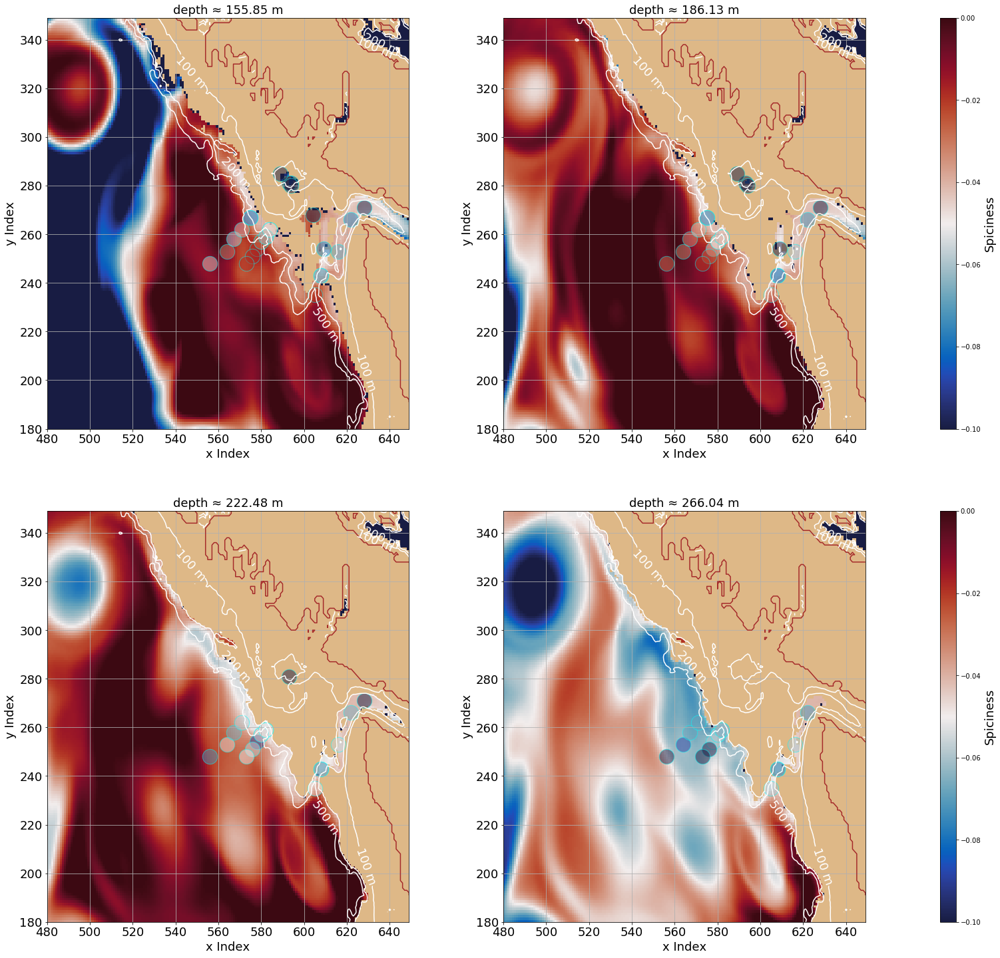

In [26]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 24, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 25, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot(level= 26, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 27, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)
plt.savefig(path_to_save + 'spice_old_sub_2.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


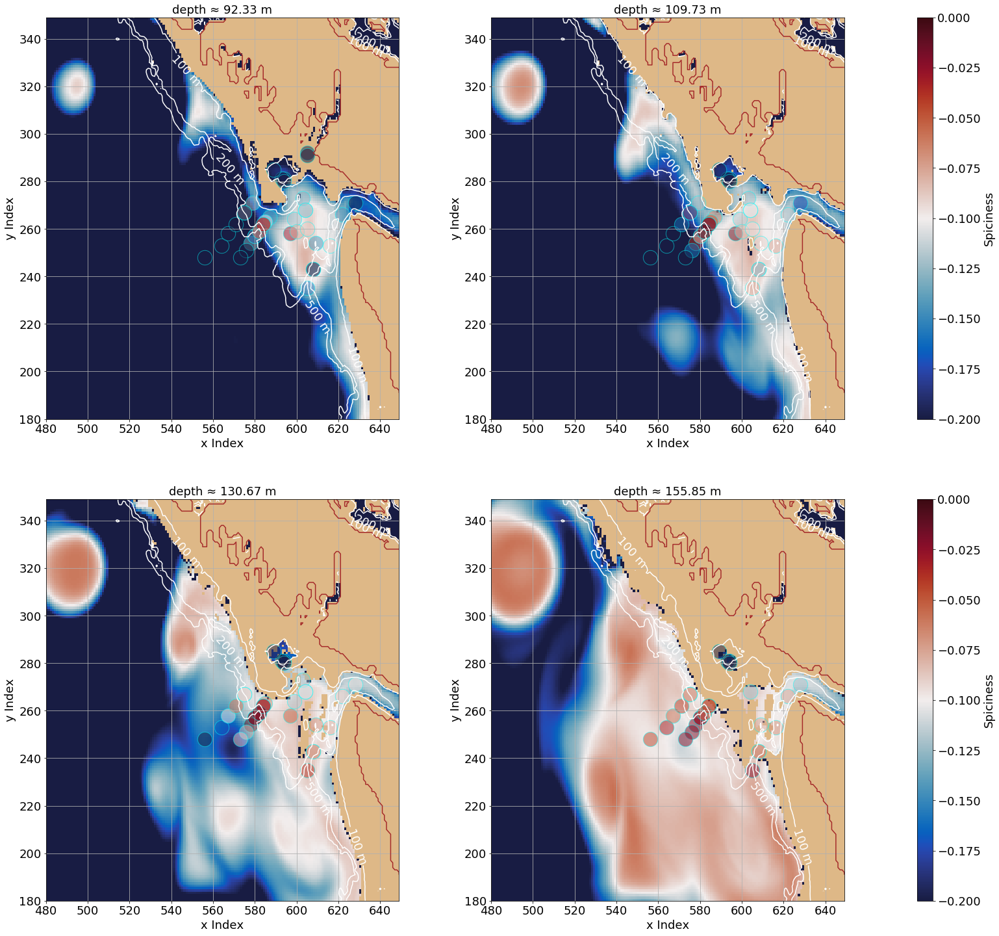

In [35]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=1, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 21, ax= axs[0,0], cmin = -0.2, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 22, ax= axs[0,1], cmin = -0.2, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_spic_subplot(level= 23, ax= axs[1,0], cmin = -0.2, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 24, ax= axs[1,1], cmin = -0.2, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

plt.savefig(path_to_save + 'spice_corrected_sub_1.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


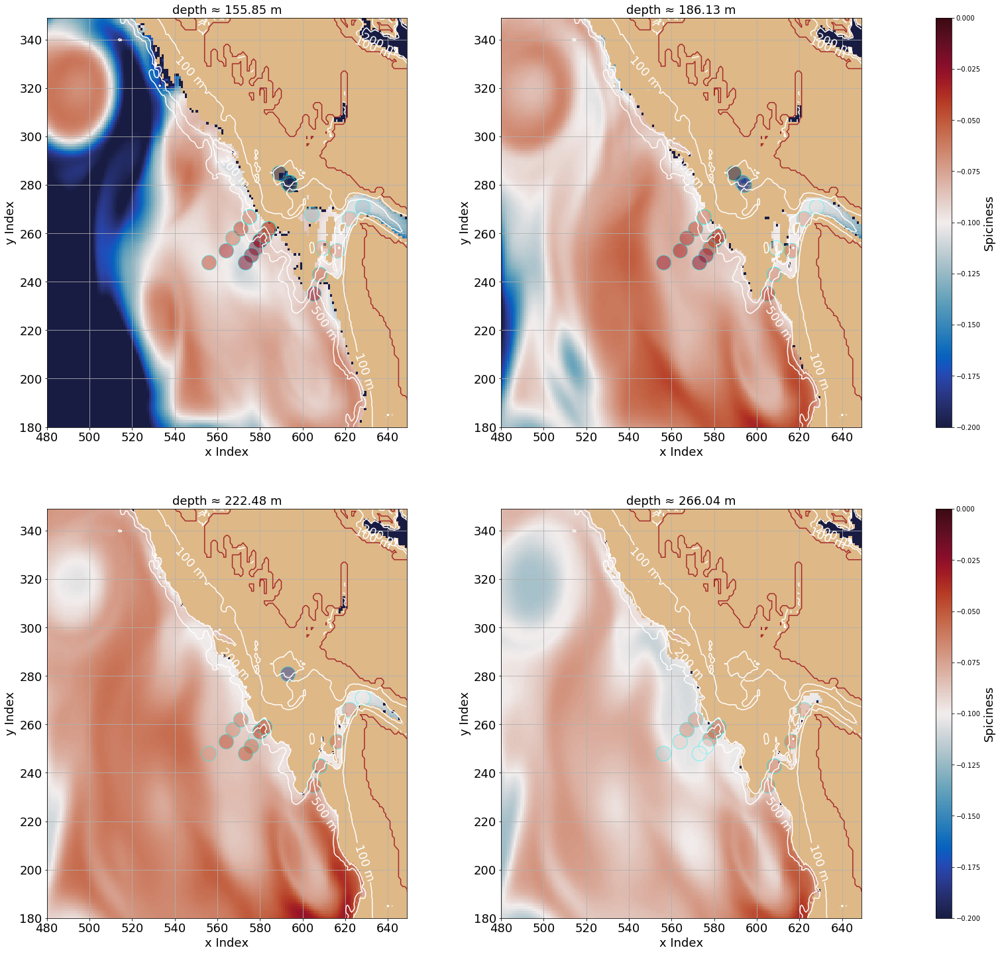

In [36]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 24, ax= axs[0,0], cmin = -0.2, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 25, ax= axs[0,1], cmin = -0.2, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot(level= 26, ax= axs[1,0], cmin = -0.2, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 27, ax= axs[1,1], cmin = -0.2, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)
plt.savefig(path_to_save + 'spice_corrected_sub_2.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


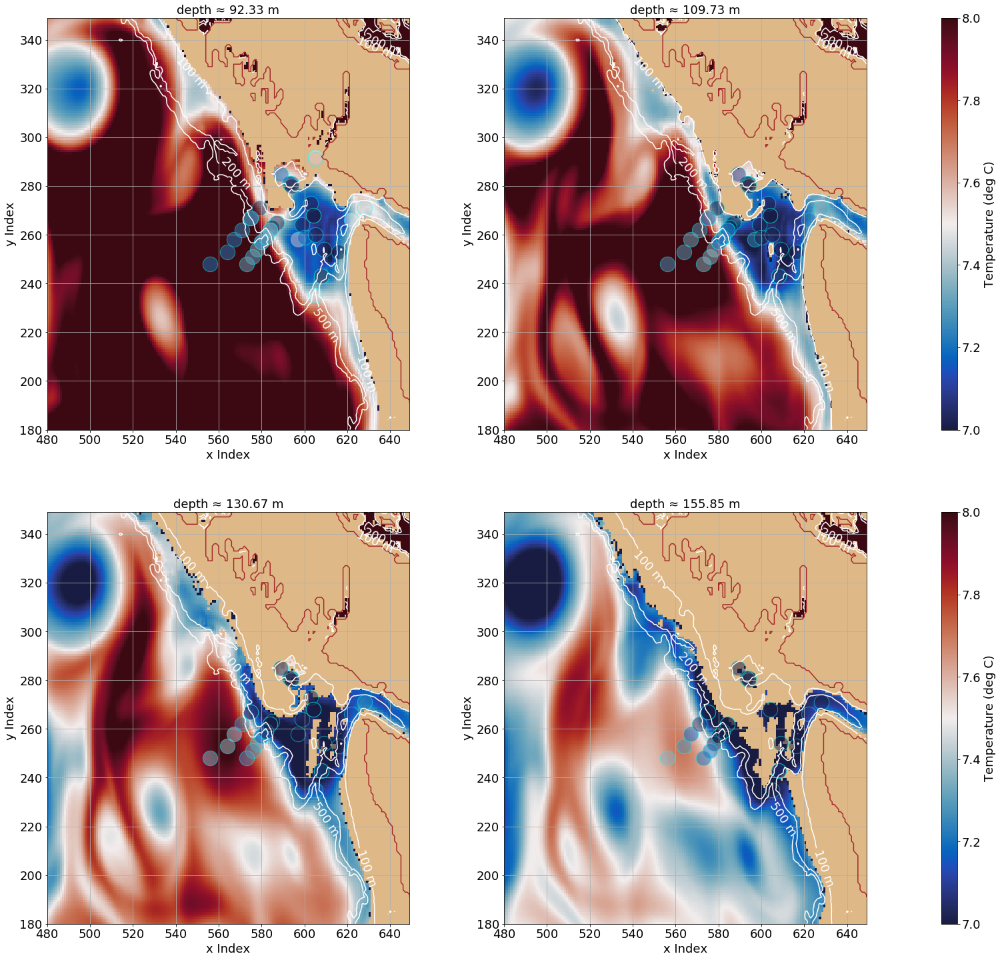

In [27]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_temp_subplot(level= 21, ax= axs[0,0], cmin = 7, cmax = 8)
axs[0,1], mesh = plot_temp_subplot(level= 22, ax= axs[0,1], cmin = 7, cmax = 8)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_temp_subplot(level= 23, ax= axs[1,0], cmin = 7, cmax = 8)
axs[1,1], mesh = plot_temp_subplot(level= 24, ax= axs[1,1], cmin = 7, cmax = 8)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 
plt.savefig(path_to_save + 'temp_old_sub_1.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


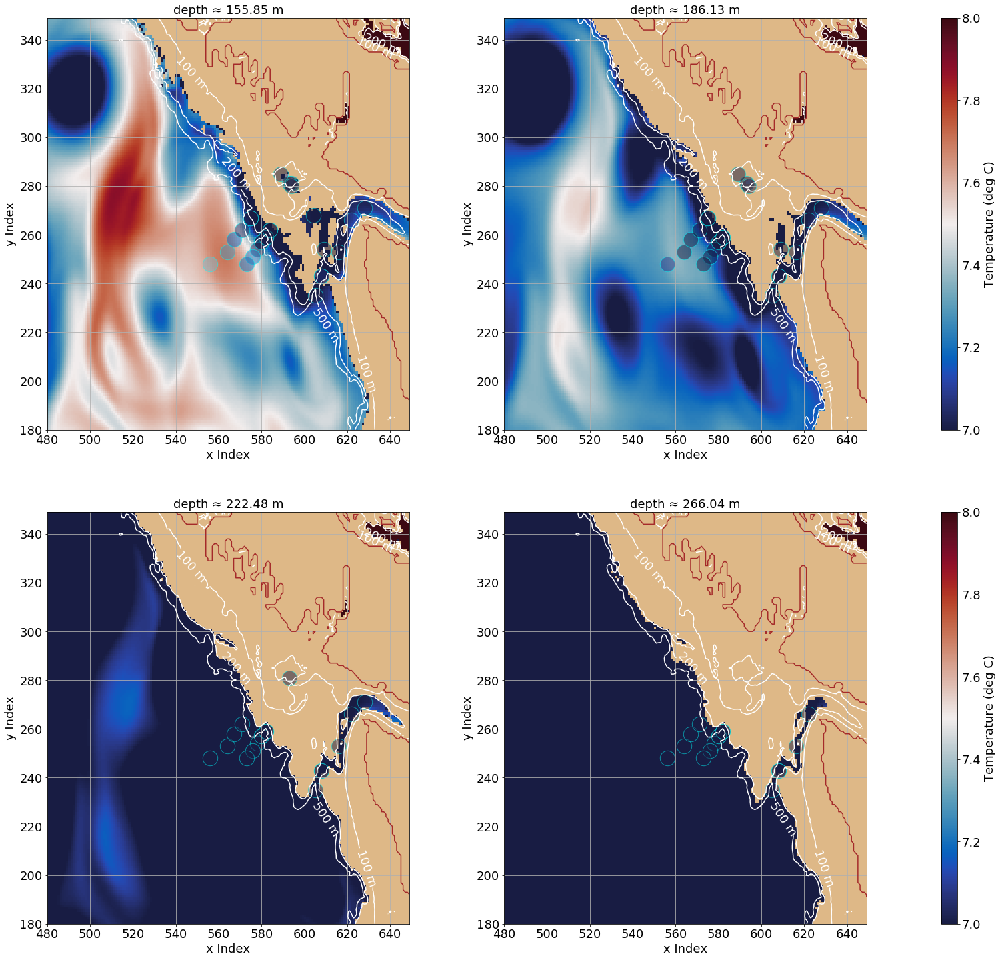

In [28]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_temp_subplot(level= 24, ax= axs[0,0], cmin = 7, cmax = 8)
axs[0,1], mesh = plot_temp_subplot(level= 25, ax= axs[0,1], cmin = 7, cmax = 8)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_temp_subplot(level= 26, ax= axs[1,0], cmin = 7, cmax = 8)
axs[1,1], mesh = plot_temp_subplot(level= 27, ax= axs[1,1], cmin = 7, cmax = 8)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 
plt.savefig(path_to_save + 'temp_old_sub_2.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


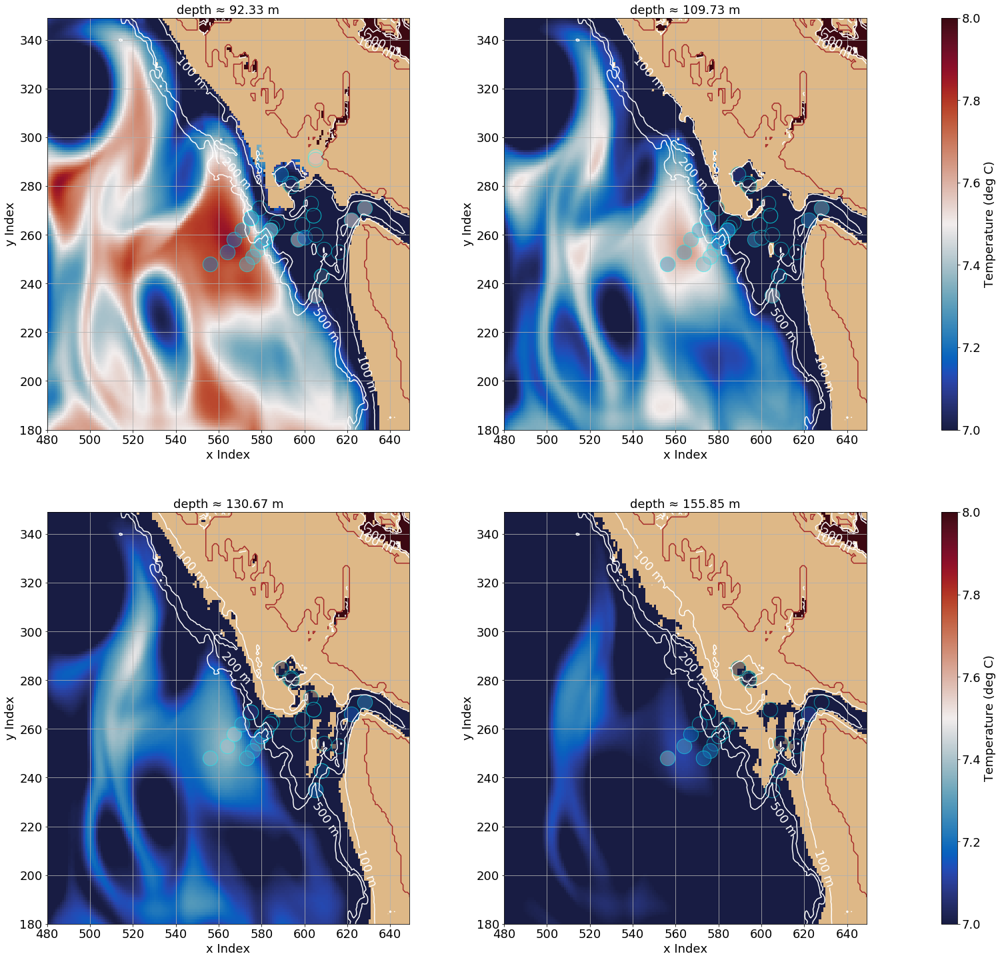

In [37]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_temp_subplot(level= 21, ax= axs[0,0], cmin = 7, cmax = 8)
axs[0,1], mesh = plot_temp_subplot(level= 22, ax= axs[0,1], cmin = 7, cmax = 8)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_temp_subplot(level= 23, ax= axs[1,0], cmin = 7, cmax = 8)
axs[1,1], mesh = plot_temp_subplot(level= 24, ax= axs[1,1], cmin = 7, cmax = 8)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 
plt.savefig(path_to_save + 'temp_corrected_sub_1.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


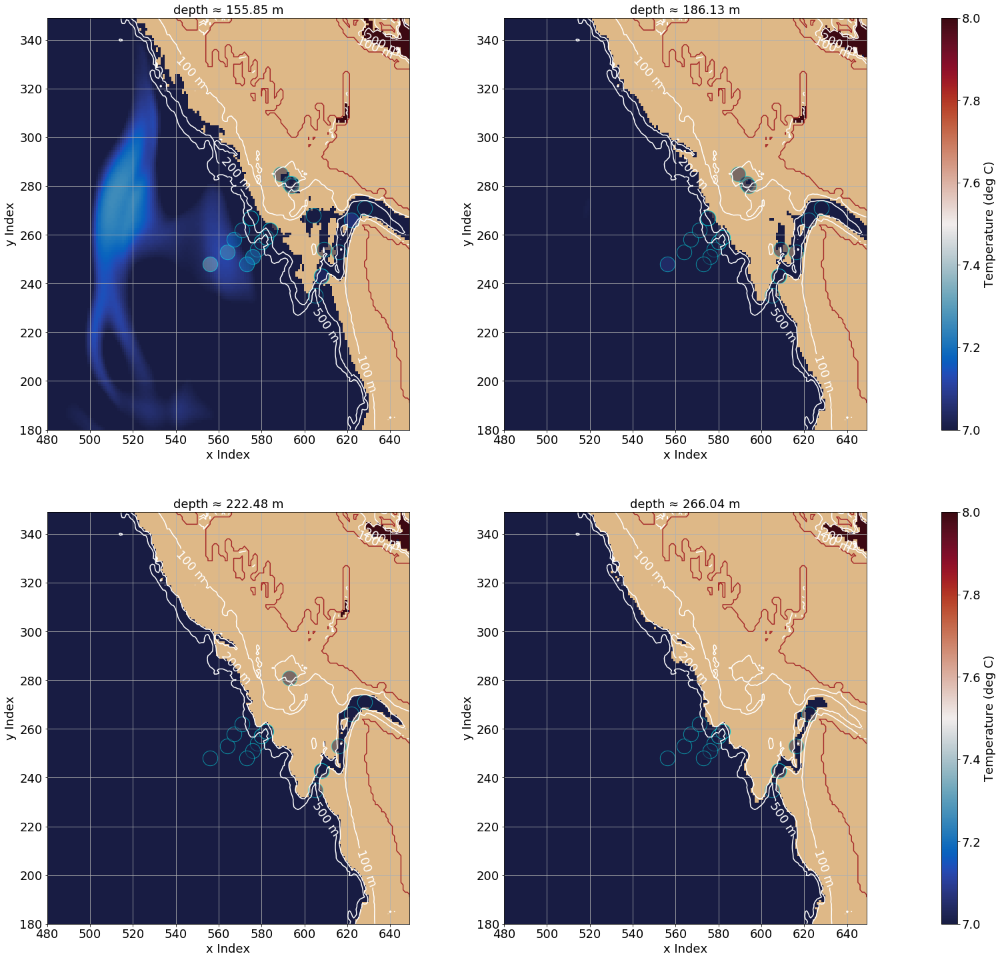

In [38]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_temp_subplot(level= 24, ax= axs[0,0], cmin = 7, cmax = 8)
axs[0,1], mesh = plot_temp_subplot(level= 25, ax= axs[0,1], cmin = 7, cmax = 8)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_temp_subplot(level= 26, ax= axs[1,0], cmin = 7, cmax = 8)
axs[1,1], mesh = plot_temp_subplot(level= 27, ax= axs[1,1], cmin = 7, cmax = 8)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Temperature (deg C)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 
plt.savefig(path_to_save + 'temp_corrected_sub_2.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


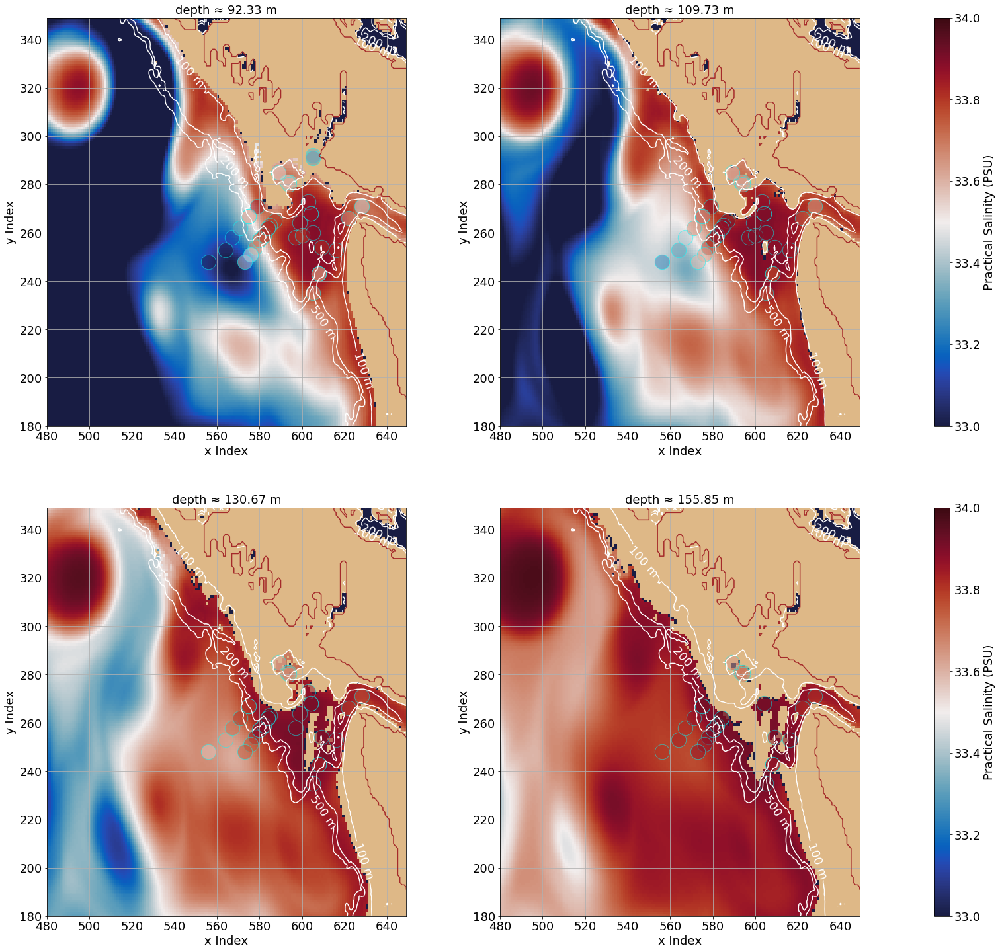

In [29]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_sal_subplot(level= 21, ax= axs[0,0], cmin = 33, cmax = 34)
axs[0,1], mesh = plot_sal_subplot(level= 22, ax= axs[0,1], cmin = 33, cmax = 34)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_sal_subplot(level= 23, ax= axs[1,0], cmin = 33, cmax = 34)
axs[1,1], mesh = plot_sal_subplot(level= 24, ax= axs[1,1], cmin = 33, cmax = 34)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 
plt.savefig(path_to_save + 'sal_sub_1.png')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


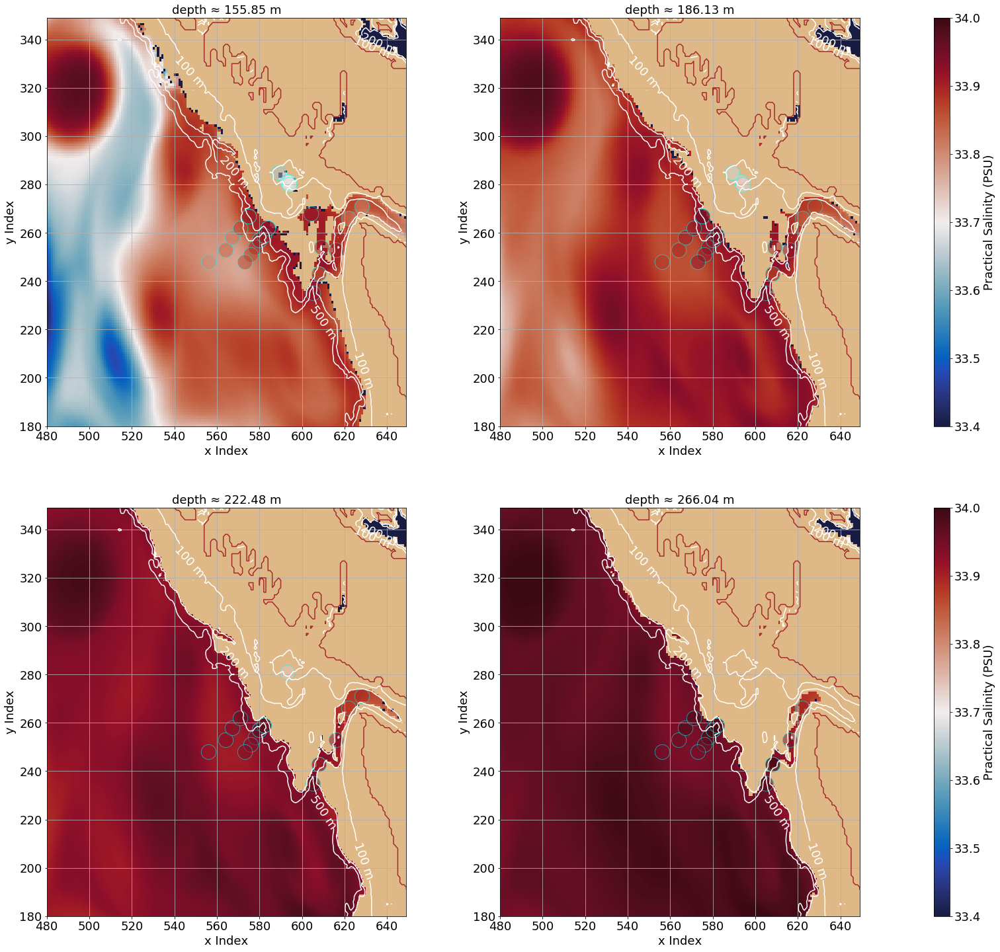

In [30]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_sal_subplot(level= 24, ax= axs[0,0], cmin = 33.4, cmax = 34)
axs[0,1], mesh = plot_sal_subplot(level= 25, ax= axs[0,1], cmin = 33.4, cmax = 34)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[1,0], mesh = plot_sal_subplot(level= 26, ax= axs[1,0], cmin = 33.4, cmax = 34)
axs[1,1], mesh = plot_sal_subplot(level= 27, ax= axs[1,1], cmin = 33.4, cmax = 34)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 
plt.savefig(path_to_save + 'sal_sub_2.png')

In [75]:
for file_number in np.arange(1,len(file)-1):
    print(file_number)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37


In [80]:
j = n[file_number]
i = m[file_number]

In [107]:
file_number = 12

In [108]:
t

132

In [106]:
temp.shape

(180, 32, 170, 170)

In [30]:

t = time_location[file_number]
j = n[file_number]
i = m[file_number]
model_temp_ini = temp[t,:mbathy[j,i],j,i]
model_temp = model_temp_ini[np.nonzero(model_temp_ini)]


zlevels[:model_temp.shape[0]]

array([   0.49402538,    1.5413754 ,    2.64566851,    3.81949472,
          5.07822371,    6.44061422,    7.92956018,    9.57299709,
         11.40500259,   13.46713829,   15.8100729 ,   18.49555969,
         21.59881592,   25.21140862,   29.44472885,   34.43415451,
         40.34405136,   47.37368774,   55.76428986,   65.80727386,
         77.85385132,   92.32607269,  109.72927856,  130.66598511,
        155.85072327,  186.12556458,  222.47517395], dtype=float32)

In [103]:
model_temp_ini

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.], dtype=float32)

In [83]:
mbathy[100,100]

22

In [53]:
model_temp.shape

(0,)

In [65]:
def add_model_data_to_bin_at_station_locations(file_number, z_bin_1, z_bin_2, z_bin_3,\
                    tem_bin_1, tem_bin_2, tem_bin_3, \
                   sal_bin_1, sal_bin_2, sal_bin_3, \
                   spic_bin_1, spic_bin_2, spic_bin_3):
    
    t = time_location[file_number]
    j = n[file_number]
    i = m[file_number]
        
    model_temp_ini = temp[t,:mbathy[j,i],j,i]
    model_temp = model_temp_ini[np.nonzero(model_temp_ini)]
#     model_temp = np.ma.masked_array(model_temp_ini, mask= 1- tmask[:mbathy[j,i],j,i])

    model_sal_ini = sal[t,:mbathy[j,i],j,i]
    model_sal = model_sal_ini[np.nonzero(model_sal_ini)]

    model_spice_ini = spic[t,:mbathy[j,i],j,i]
    model_spice = model_spice_ini[np.nonzero(model_sal_ini)]

    

    z_obs = np.array(z_location[file_number])

    
    
    
    func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
    model_temp_interp = func_temp(z_obs)
    
    
    func_sal = interp1d(zlevels[:model_sal.shape[0]], model_sal, fill_value='extrapolate')
    model_sal_interp = func_sal(z_obs)
    
    func_spic = interp1d(zlevels[:model_spice.shape[0]], model_spice, fill_value='extrapolate')
    model_spice_interp = func_spic(z_obs)
    
        
    
    
       
    z_data_bin_1    = z_obs[np.where(z_obs < 60)]

    tem_data_bin_1  = model_temp_interp[np.where(z_obs < 60)]

    sal_data_bin_1  = model_sal_interp[np.where(z_obs < 60)]

    spic_data_bin_1 = model_spice_interp[np.where(z_obs < 60)]
    

    z_data_bin_2    = z_obs[np.where((z_obs >= 60) & (z_obs < 120))]

    tem_data_bin_2  = model_temp_interp[np.where((z_obs >= 60) & (z_obs < 120))]

    sal_data_bin_2  = model_sal_interp[np.where((z_obs >= 60) & (z_obs < 120))]

    spic_data_bin_2 = model_spice_interp[np.where((z_obs >= 60) & (z_obs < 120))]
    

    z_data_bin_3    = z_obs[np.where((z_obs >= 120)& (z_obs <=500))]

    tem_data_bin_3  = model_temp_interp[np.where((z_obs >= 120) & (z_obs <500))]

    sal_data_bin_3  = model_sal_interp[np.where((z_obs >= 120) & (z_obs <500))]

    spic_data_bin_3 = model_spice_interp[np.where((z_obs >= 120) & (z_obs <500))]
    
    
    z_bin_1 = np.append(arr= z_bin_1, values= z_data_bin_1)
    z_bin_2 = np.append(arr= z_bin_2, values= z_data_bin_2)
    z_bin_3 = np.append(arr= z_bin_3, values= z_data_bin_3)
    
    tem_bin_1 = np.append(arr= tem_bin_1, values= tem_data_bin_1)
    tem_bin_2 = np.append(arr= tem_bin_2, values= tem_data_bin_2)
    tem_bin_3 = np.append(arr= tem_bin_3, values= tem_data_bin_3)
    
    sal_bin_1 = np.append(arr= sal_bin_1, values= sal_data_bin_1)
    sal_bin_2 = np.append(arr= sal_bin_2, values= sal_data_bin_2)
    sal_bin_3 = np.append(arr= sal_bin_3, values= sal_data_bin_3)
    
    spic_bin_1 = np.append(arr= spic_bin_1, values= spic_data_bin_1)
    spic_bin_2 = np.append(arr= spic_bin_2, values= spic_data_bin_2)
    spic_bin_3 = np.append(arr= spic_bin_3, values= spic_data_bin_3)
    
    return z_bin_1, z_bin_2, z_bin_3, tem_bin_1, tem_bin_2, tem_bin_3, sal_bin_1, sal_bin_2, sal_bin_3, spic_bin_1, spic_bin_2, spic_bin_3
    

    
    
    
    
    

In [66]:
z_bin_1_m = []
z_bin_2_m = []
z_bin_3_m = []

tem_bin_1_m = []
tem_bin_2_m = []
tem_bin_3_m = []

sal_bin_1_m = []
sal_bin_2_m = []
sal_bin_3_m = []

spic_bin_1_m = []
spic_bin_2_m = []
spic_bin_3_m = []


for file_number in np.arange(1,len(file)-1):
    if file_number!=23:
        z_bin_1_m, z_bin_2_m, z_bin_3_m, \
        tem_bin_1_m, tem_bin_2_m,tem_bin_3_m, \
        sal_bin_1_m, sal_bin_2_m, sal_bin_3_m, \
        spic_bin_1_m, spic_bin_2_m, spic_bin_3_m = add_model_data_to_bin_at_station_locations(file_number, z_bin_1_m, z_bin_2_m, z_bin_3_m,\
                                                             tem_bin_1_m, tem_bin_2_m, tem_bin_3_m, \
                                                             sal_bin_1_m, sal_bin_2_m, sal_bin_3_m, \
                                                             spic_bin_1_m, spic_bin_2_m, spic_bin_3_m)
    


In [67]:
def add_data_to_bin(file_number, z_bin_1, z_bin_2, z_bin_3,\
                    tem_bin_1, tem_bin_2, tem_bin_3, \
                   sal_bin_1, sal_bin_2, sal_bin_3, \
                   spic_bin_1, spic_bin_2, spic_bin_3):
    



    z_data = z_location[file_number]

    tem_data = temp_location[file_number]

    sal_data = sal_location[file_number]

    spic_data = spic_falk_loc[file_number]
    
       
    z_data_bin_1    = z_data[np.where(z_data < 60)]

    tem_data_bin_1  = tem_data[np.where(z_data < 60)]

    sal_data_bin_1  = sal_data[np.where(z_data < 60)]

    spic_data_bin_1 = spic_data[np.where(z_data < 60)]
    

    z_data_bin_2    = z_data[np.where((z_data >= 60) & (z_data < 120))]

    tem_data_bin_2  = tem_data[np.where((z_data >= 60) & (z_data < 120))]

    sal_data_bin_2  = sal_data[np.where((z_data >= 60) & (z_data < 120))]

    spic_data_bin_2 = spic_data[np.where((z_data >= 60) & (z_data < 120))]
    

    z_data_bin_3    = z_data[np.where((z_data >= 120) & (z_data <500))]

    tem_data_bin_3  = tem_data[np.where((z_data >= 120)& (z_data <500))]

    sal_data_bin_3  = sal_data[np.where((z_data >= 120)& (z_data <500))]

    spic_data_bin_3 = spic_data[np.where((z_data >= 120)& (z_data <500))]
    
    
    z_bin_1 = np.append(arr= z_bin_1, values= z_data_bin_1)
    z_bin_2 = np.append(arr= z_bin_2, values= z_data_bin_2)
    z_bin_3 = np.append(arr= z_bin_3, values= z_data_bin_3)
    
    tem_bin_1 = np.append(arr= tem_bin_1, values= tem_data_bin_1)
    tem_bin_2 = np.append(arr= tem_bin_2, values= tem_data_bin_2)
    tem_bin_3 = np.append(arr= tem_bin_3, values= tem_data_bin_3)
    
    sal_bin_1 = np.append(arr= sal_bin_1, values= sal_data_bin_1)
    sal_bin_2 = np.append(arr= sal_bin_2, values= sal_data_bin_2)
    sal_bin_3 = np.append(arr= sal_bin_3, values= sal_data_bin_3)
    
    spic_bin_1 = np.append(arr= spic_bin_1, values= spic_data_bin_1)
    spic_bin_2 = np.append(arr= spic_bin_2, values= spic_data_bin_2)
    spic_bin_3 = np.append(arr= spic_bin_3, values= spic_data_bin_3)
    
    return z_bin_1, z_bin_2, z_bin_3, tem_bin_1, tem_bin_2, tem_bin_3, sal_bin_1, sal_bin_2, sal_bin_3, spic_bin_1, spic_bin_2, spic_bin_3
    

    
    
    
    
    

In [68]:
z_bin_1 = []
z_bin_2 = []
z_bin_3 = []

tem_bin_1 = []
tem_bin_2 = []
tem_bin_3 = []

sal_bin_1 = []
sal_bin_2 = []
sal_bin_3 = []

spic_bin_1 = []
spic_bin_2 = []
spic_bin_3 = []


for file_number in np.arange(1,len(file)-1):
    if file_number!=23:
        z_bin_1, z_bin_2, z_bin_3, \
        tem_bin_1, tem_bin_2,tem_bin_3, \
        sal_bin_1, sal_bin_2, sal_bin_3, \
        spic_bin_1, spic_bin_2, spic_bin_3 = add_data_to_bin(file_number, z_bin_1, z_bin_2, z_bin_3,\
                                                             tem_bin_1, tem_bin_2, tem_bin_3, \
                                                             sal_bin_1, sal_bin_2, sal_bin_3, \
                                                             spic_bin_1, spic_bin_2, spic_bin_3)


In [51]:
time_location

array([112, 112, 112, 113, 113, 113, 113, 113, 113, 113, 113, 113, 113,
       113, 114, 114, 114, 115, 115, 115, 115, 115, 115, 115, 116, 116,
       116, 117, 118, 119, 119, 119, 119, 120, 120, 120, 120, 120, 123])

In [17]:
import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np

class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):

        self.sg.fig.set_size_inches(self.fig.get_size_inches())

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [55]:
sns.set_context('paper')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}
plt.style.use('seaborn')

In [19]:
def get_stat_tem(obs_temp, model_temp, z_data):
    
#     func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
#     model_temp_interp = func_temp(z_data)
    
    model_temp_interp = model_temp

    obar = np.nanmean(obs_temp)
    mprime = model_temp_interp - obar
    oprime = obs_temp - obar

    diff_sq = np.sum((model_temp_interp-obs_temp)**2)
    add_sq = np.sum((np.abs(mprime) + np.abs(oprime))**2)

    ws = 1-diff_sq/add_sq



    error = model_temp_interp - obs_temp
    gamma2 = np.var(error)/np.var(obs_temp)
    mean_error = np.mean(error)
    mean_abs_error = np.mean(np.abs(error))
    rms_error = np.sqrt(np.mean(error**2))
    
    return gamma2,rms_error,ws

def get_stat_sal(obs_sal, model_sal, z_data):
    
#     func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
#     model_temp_interp = func_temp(z_data)
    
    model_temp_interp = model_sal
    obs_temp = obs_sal

    obar = np.nanmean(obs_temp)
    mprime = model_temp_interp - obar
    oprime = obs_temp - obar

    diff_sq = np.sum((model_temp_interp-obs_temp)**2)
    add_sq = np.sum((np.abs(mprime) + np.abs(oprime))**2)

    ws = 1-diff_sq/add_sq



    error = model_temp_interp - obs_temp
    gamma2 = np.var(error)/np.var(obs_temp)
    mean_error = np.mean(error)
    mean_abs_error = np.mean(np.abs(error))
    rms_error = np.sqrt(np.mean(error**2))
    
    return gamma2,rms_error,ws


def get_stat_spice(obs_spice, model_spice, z_data):
    
#     func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
#     model_temp_interp = func_temp(z_data)
    
    model_temp_interp = model_spice
    obs_temp = obs_spice

    obar = np.nanmean(obs_temp)
    mprime = model_temp_interp - obar
    oprime = obs_temp - obar

    diff_sq = np.sum((model_temp_interp-obs_temp)**2)
    add_sq = np.sum((np.abs(mprime) + np.abs(oprime))**2)

    ws = 1-diff_sq/add_sq



    error = model_temp_interp - obs_temp
    gamma2 = np.var(error)/np.var(obs_temp)
    mean_error = np.mean(error)
    mean_abs_error = np.mean(np.abs(error))
    rms_error = np.sqrt(np.mean(error**2))
    
    return gamma2,rms_error,ws




def plot_stat_bin(bin_number):
    if bin_number == 'bin1':
        obs_temp    = tem_bin_1 
        model_temp  = tem_bin_1_m
        obs_sal     = sal_bin_1
        model_sal   = sal_bin_1_m
        obs_spice   = spic_bin_1
        model_spice = spic_bin_1_m 
        z_data      = z_bin_1
        
    if bin_number == 'bin2':
        obs_temp    = tem_bin_2 
        model_temp  = tem_bin_2_m
        obs_sal     = sal_bin_2
        model_sal   = sal_bin_2_m
        obs_spice   = spic_bin_2
        model_spice = spic_bin_2_m 
        z_data      = z_bin_2
        
    if bin_number == 'bin3':
        obs_temp    = tem_bin_3 
        model_temp  = tem_bin_3_m
        obs_sal     = sal_bin_3
        model_sal   = sal_bin_3_m
        obs_spice   = spic_bin_3
        model_spice = spic_bin_3_m 
        z_data      = z_bin_3
        
    df =pd.DataFrame()
    df['Observed_temp'] = obs_temp
    df['Model_temp'] = model_temp
    df['Observed_Salinity'] = obs_sal
    df['Model_Salinity'] = model_sal
    df['Observed_Spice'] = obs_spice
    df['Model_Spice'] = model_spice
    
    if bin_number == 'bin1':
        df["Depth (m)"] = z_bin_1
        
    if bin_number == 'bin2':
        df["Depth (m)"] = z_bin_2
        
    if bin_number == 'bin3':
        df["Depth (m)"] = z_bin_3
        
    sns.set(style="white")
#     plt.figure(figsize=(60,60))
    p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df,palette=cm.plasma_r)
    q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.RdBu)#, palette=cmap)
    g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.plasma_r)#, palette=cmap)
    leg = p.axes[0, 0].get_legend()
    p.axes[0,0].legend(loc="best")
    leg = q.axes[0, 0].get_legend()
    q.axes[0,0].legend(loc="best")
    # leg.set_title(Depth)
    # labs = leg.texts
    # labs[0].set_text("(50-75)m")
    # labs[1].set_text("(75 - 100)m")
    lims = [
        np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
        np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
    ]

    p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    gamma2,rms_error,ws = get_stat_tem(obs_temp, model_temp, z_data)
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                           bbox_to_anchor=(0., 1.),
                           bbox_transform=p.axes[0,0].transAxes
                           )
    p.axes[0,0].add_artist(anchored_text)

    lims = [
        np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
        np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
    ]

    q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    gamma2,rms_error,ws = get_stat_sal(obs_sal, model_sal, z_data)
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                           bbox_to_anchor=(0., 1.),
                           bbox_transform=q.axes[0,0].transAxes
                           )
    q.axes[0,0].add_artist(anchored_text)

    lims = [
        np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
        np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
    ]

    g.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    gamma2,rms_error,ws = get_stat_spice(obs_spice, model_spice, z_data)
    anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                           bbox_to_anchor=(0., 1.),
                           bbox_transform=g.axes[0,0].transAxes
                           )
    g.axes[0,0].add_artist(anchored_text)
    # labs[2].set_text("Type 2")
    # labs[3].set_text("Type 3")

    # fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

    # fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
    fig = plt.figure(figsize=(15,5))
    gs = gridspec.GridSpec(1, 3)
    mg0 = SeabornFig2Grid(p, fig, gs[0])
    mg1 = SeabornFig2Grid(q, fig, gs[1])
    mg2 = SeabornFig2Grid(g, fig, gs[2])

    # mg3 = SeabornFig2Grid(p, fig, gs[3])

    # plt.show()
    gs.tight_layout(fig)




Model vs Observed (0 to 50m)


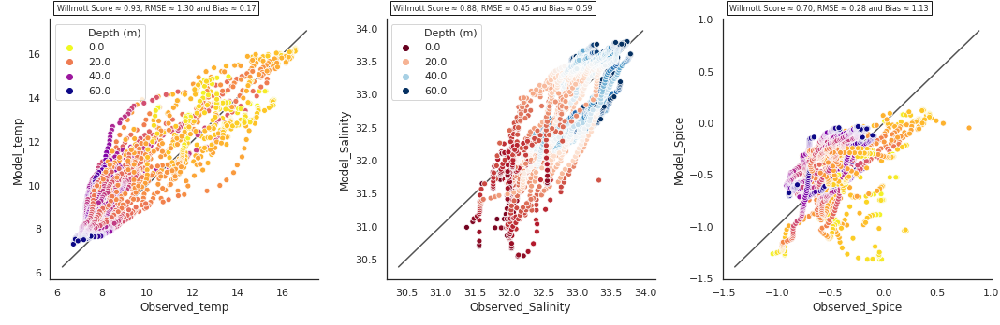

In [182]:
print("Model vs Observed (0 to 50m)")
plot_stat_bin('bin1')

Model vs Observed for Bin 2 (60m to 120m)


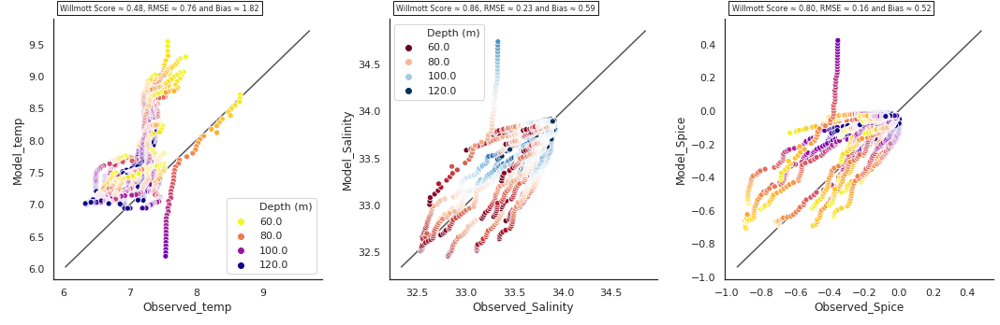

In [183]:
print('Model vs Observed for Bin 2 (60m to 120m)')
plot_stat_bin('bin2')

Model vs Observed (120m to 500m)


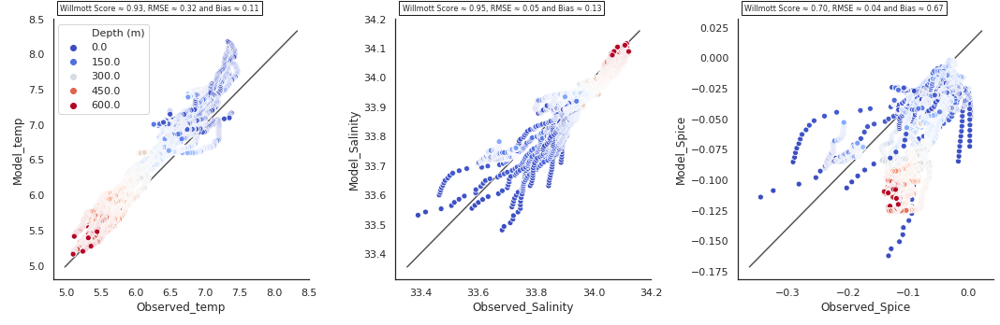

In [184]:
print("Model vs Observed (120m to 500m)")

df =pd.DataFrame()
df['Observed_temp'] = tem_bin_3
df['Model_temp'] = tem_bin_3_m
df['Observed_Salinity'] = sal_bin_3
df['Model_Salinity'] = sal_bin_3_m
df['Observed_Spice'] = spic_bin_3
df['Model_Spice'] = spic_bin_3_m


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = z_bin_3[:]

p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df, legend='brief',palette=cm.coolwarm)
q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.coolwarm)#, palette=cmap)
g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cm.coolwarm)#, palette=cmap)
leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_tem(tem_bin_3, tem_bin_3_m, z_bin_3)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_sal(sal_bin_3, sal_bin_3_m, z_bin_3)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=q.axes[0,0].transAxes
                       )
q.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]

lims3 = [
    np.min([g.axes[0,0].get_ylim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]


g.axes[0,0].plot(lims, lims3, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_spice(spic_bin_3, spic_bin_3_m, z_bin_3)
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=g.axes[0,0].transAxes
                       )
g.axes[0,0].add_artist(anchored_text)
# labs[2].set_text("Type 2")
# labs[3].set_text("Type 3")

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 3)
mg0 = SeabornFig2Grid(p, fig, gs[0])
mg1 = SeabornFig2Grid(q, fig, gs[1])
mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)


In [21]:
tem_bin_3_m[tem_bin_3_m < 5] = 'Nan'
sal_bin_3_m[np.isnan(tem_bin_3_m)] = 'Nan'
spic_bin_3_m[np.isnan(tem_bin_3_m)] = 'Nan'



In [52]:
np.nanmax(sal_bin_3)

34.121299999999998

Model vs Observed


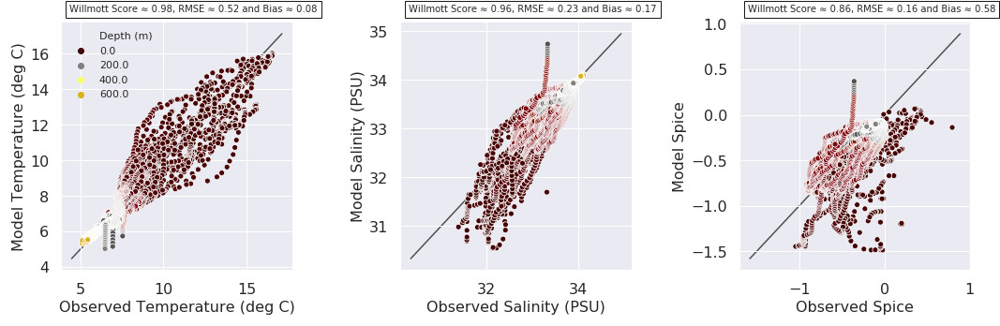

In [54]:
sns.set()

print("Model vs Observed")

df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(40,400),data=df, legend='brief',palette=cmo.cm.oxy)
q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)

# g.get_legend().remove()
# norm = plt.Normalize(np.min(df["Depth (m)"]), np.max(df["Depth (m)"]))
# sm = plt.cm.ScalarMappable(cmap=cmo.cm.oxy, norm=norm)
# sm.set_array([])
# g.axes[0,0].figure.colorbar(sm)

leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)
p.axes[0,0].tick_params(axis='both',labelsize =16)
p.axes[0,0].set_xlabel('Observed Temperature (deg C)', fontsize = 16)
p.axes[0,0].set_ylabel('Model Temperature (deg C)', fontsize = 16)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_sal(df['Observed_Salinity'], df['Model_Salinity'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=q.axes[0,0].transAxes
                       )
q.axes[0,0].add_artist(anchored_text)
q.axes[0,0].tick_params(axis='both',labelsize =16)
q.axes[0,0].set_xlabel('Observed Salinity (PSU)', fontsize = 16)
q.axes[0,0].set_ylabel('Model Salinity (PSU)', fontsize = 16)

lims = [
    np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]

lims3 = [
    np.min([g.axes[0,0].get_ylim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]




g.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_spice(df['Observed_Spice'], df['Model_Spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=g.axes[0,0].transAxes
                       )
g.axes[0,0].add_artist(anchored_text)
g.axes[0,0].tick_params(axis='both',labelsize =16)
g.axes[0,0].set_xlabel('Observed Spice', fontsize = 16)
g.axes[0,0].set_ylabel('Model Spice', fontsize = 16)




# labs[2].set_text("Type 2")
# labs[3].set_text("Type 3")

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 3)
mg0 = SeabornFig2Grid(p, fig, gs[0])
mg1 = SeabornFig2Grid(q, fig, gs[1])
mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)
# plt.savefig(path_to_save+'Model_Stat_scores.png')



Model vs Observed


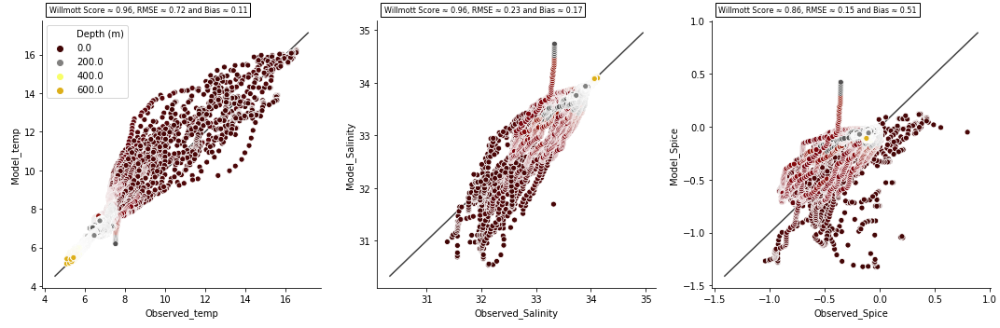

In [179]:
print("Model vs Observed")

df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)

p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df, legend='brief',palette=cmo.cm.oxy)
q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_sal(df['Observed_Salinity'], df['Model_Salinity'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=q.axes[0,0].transAxes
                       )
q.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]

lims3 = [
    np.min([g.axes[0,0].get_ylim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]


g.axes[0,0].plot(lims, lims3, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_spice(df['Observed_Spice'], df['Model_Spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=g.axes[0,0].transAxes
                       )
g.axes[0,0].add_artist(anchored_text)
# labs[2].set_text("Type 2")
# labs[3].set_text("Type 3")

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 3)
mg0 = SeabornFig2Grid(p, fig, gs[0])
mg1 = SeabornFig2Grid(q, fig, gs[1])
mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)


TypeError: 'AxesSubplot' object is not iterable

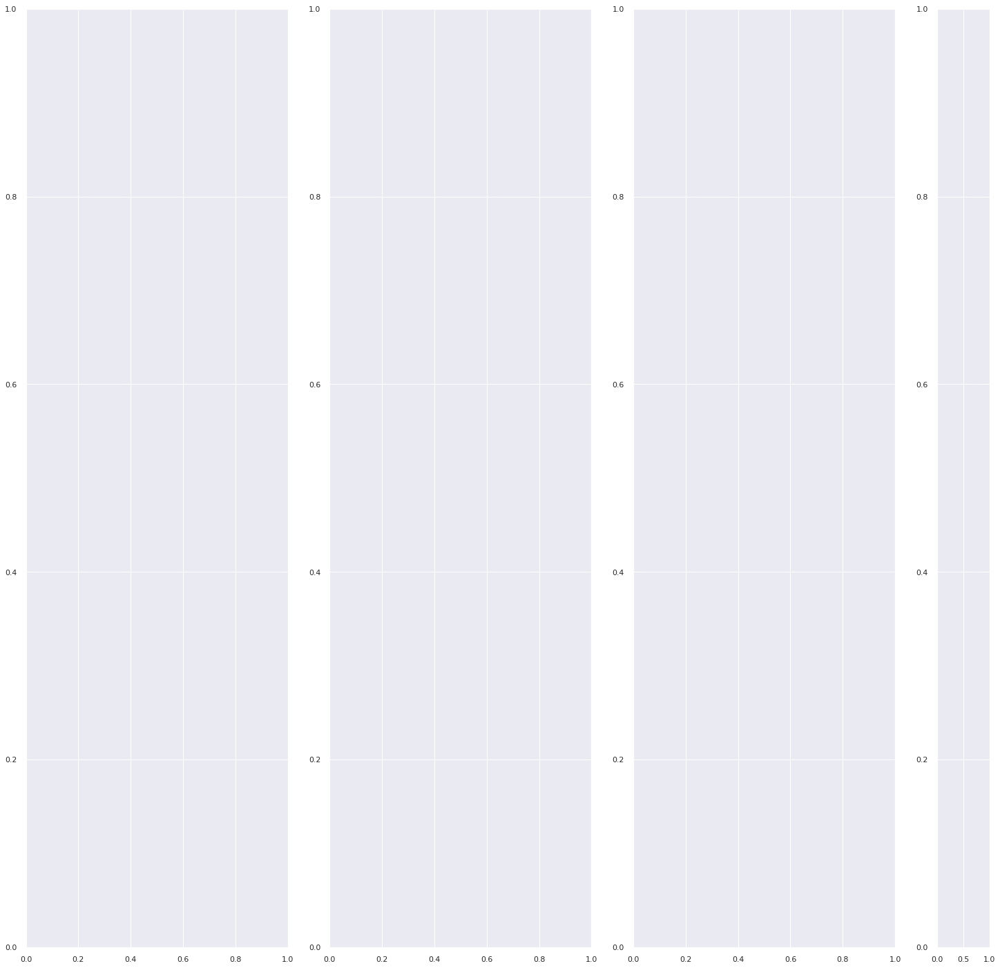

In [69]:
fig, axs = plt.subplots(1, 4, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25, 5]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], p = df.plot.scatter(x="Observed_temp", y="Model_temp", c = "Depth (m)", ax = ax1, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)

# axs[0,1], mesh = plot_sal_subplot(level= 22, ax= axs[0,1], cmin = 33, cmax = 34)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label = 'Practical Salinity (PSU)', fontsize = 18)
cbar.ax.tick_params(labelsize=18) 

axs[0,1], q = df.plot.scatter(x="Observed_Salinity", y="Model_Salinity", c = "Depth (m)", ax = ax2, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# axs[1,1], mesh = plot_sal_subplot(level= 24, ax= axs[1,1], cmin = 33, cmax = 34)


In [38]:
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}
plt.style.use('seaborn')

Model vs Observed


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


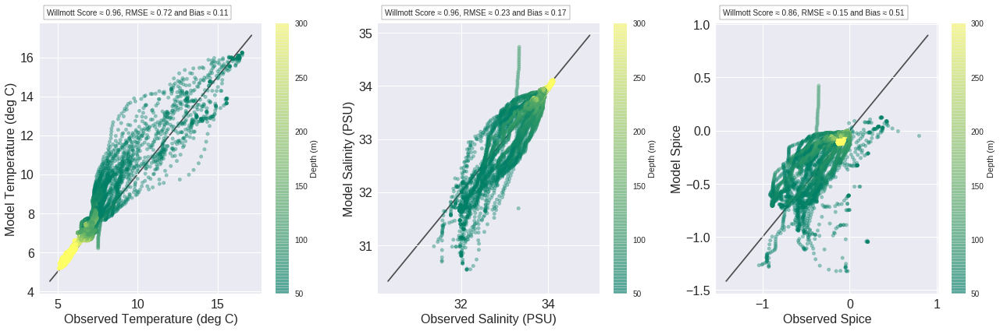

In [69]:
print("Model vs Observed")

cmin = 50
cmax = 300



import matplotlib as mpl
# norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap('summer')

df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)

# fig, (ax1,ax2,ax3)  = plt.subplots(1,3,figsize=(15,5))

fig = plt.figure(1, figsize=(18,6))
                 
gs = gridspec.GridSpec(1,3, width_ratios=[1,1,1])

# gs.update(left=0.05, right=0.95, bottom=0.08, top=0.93, wspace=0.02, hspace=0.03)

ax1 = plt.subplot(gs[0,0])

ax2 = plt.subplot(gs[0,1])

ax3 = plt.subplot(gs[0,2])


            

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df, legend='brief',palette=cmo.cm.oxy)

p = df.plot.scatter(x="Observed_temp", y="Model_temp", c = "Depth (m)", ax = ax1, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.4)

leg = ax1.get_legend()
ax1.legend(loc="best")

lims = [
    np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
    np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]

ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax1.transAxes
                       )
ax1.add_artist(anchored_text)
ax1.tick_params(axis='both',labelsize =16)
ax1.set_xlabel('Observed Temperature (deg C)', fontsize = 16)
ax1.set_ylabel('Model Temperature (deg C)', fontsize = 16)


q = df.plot.scatter(x="Observed_Salinity", y="Model_Salinity", c = "Depth (m)", ax = ax2,  cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.4)

# q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
g = df.plot.scatter(x='Observed_Spice', y='Model_Spice', c = "Depth (m)", ax = ax3,  cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.4)


# g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)

# g.get_legend().remove()
# norm = plt.Normalize(np.min(df["Depth (m)"]), np.max(df["Depth (m)"]))
# sm = plt.cm.ScalarMappable(cmap=cmo.cm.oxy, norm=norm)
# sm.set_array([])
# g.axes[0,0].figure.colorbar(sm)

# leg = p.axes[0, 0].get_legend()
# p.axes[0,0].legend(loc="best")

# lims = [
#     np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
#     np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
# ]

# p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
# anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
#                        bbox_to_anchor=(0., 1.),
#                        bbox_transform=p.axes[0,0].transAxes
#                        )
# p.axes[0,0].add_artist(anchored_text)
# p.axes[0,0].tick_params(axis='both',labelsize =16)
# p.axes[0,0].set_xlabel('Observed Temperature (deg C)', fontsize = 16)
# p.axes[0,0].set_ylabel('Model Temperature (deg C)', fontsize = 16)

lims = [
    np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
    np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
]

ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_sal(df['Observed_Salinity'], df['Model_Salinity'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax2.transAxes
                       )
ax2.add_artist(anchored_text)
ax2.tick_params(axis='both',labelsize =16)
ax2.set_xlabel('Observed Salinity (PSU)', fontsize = 16)
ax2.set_ylabel('Model Salinity (PSU)', fontsize = 16)

lims = [
    np.min([ax3.get_xlim(), ax3.get_ylim()]),  # min of both axes
    np.max([ax3.get_xlim(), ax3.get_ylim()]),  # max of both axes
]

lims3 = [
    np.min([ax3.get_ylim(), ax3.get_ylim()]),  # min of both axes
    np.max([ax3.get_xlim(), ax3.get_ylim()]),  # max of both axes
]




ax3.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_spice(df['Observed_Spice'], df['Model_Spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax3.transAxes
                       )
ax3.add_artist(anchored_text)
ax3.tick_params(axis='both',labelsize =16)
ax3.set_xlabel('Observed Spice', fontsize = 16)
ax3.set_ylabel('Model Spice', fontsize = 16)




# labs[2].set_text("Type 2")
# labs[3].set_text("Type 3")

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
# fig = plt.figure(figsize=(15,5))
# gs = gridspec.GridSpec(1, 3)
# mg0 = SeabornFig2Grid(p, ax1, gs[0])
# mg1 = SeabornFig2Grid(ax2, fig, gs[1])
# mg2 = SeabornFig2Grid(ax3, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# cb = Colorbar(ax = cbax, mappable = plt1, orientation = 'horizontal', ticklocation = 'top')
# cb.set_label(r'Colorbar !', labelpad=10)
# plt.show()
fig.tight_layout()
# plt.savefig(path_to_save+'Model_Stat_scores.png')

# plt.colorbar(z1_plot,cax=ax2)

Model vs Observed


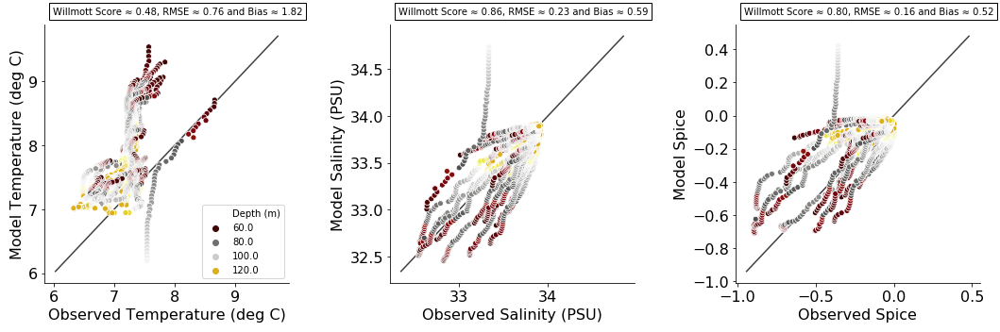

In [68]:
print("Model vs Observed")

df =pd.DataFrame()
df['Observed_temp'] = tem_bin_2
df['Model_temp'] = tem_bin_2_m
df['Observed_Salinity'] = sal_bin_2
df['Model_Salinity'] = sal_bin_2_m
df['Observed_Spice'] = spic_bin_2
df['Model_Spice'] = spic_bin_2_m


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = z_bin_2[:]

p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10),data=df, legend='brief',palette=cmo.cm.oxy)
q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)

# g.get_legend().remove()
# norm = plt.Normalize(np.min(df["Depth (m)"]), np.max(df["Depth (m)"]))
# sm = plt.cm.ScalarMappable(cmap=cmo.cm.oxy, norm=norm)
# sm.set_array([])
# g.axes[0,0].figure.colorbar(sm)

leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)
p.axes[0,0].tick_params(axis='both',labelsize =16)
p.axes[0,0].set_xlabel('Observed Temperature (deg C)', fontsize = 16)
p.axes[0,0].set_ylabel('Model Temperature (deg C)', fontsize = 16)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

q.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_sal(df['Observed_Salinity'], df['Model_Salinity'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=q.axes[0,0].transAxes
                       )
q.axes[0,0].add_artist(anchored_text)
q.axes[0,0].tick_params(axis='both',labelsize =16)
q.axes[0,0].set_xlabel('Observed Salinity (PSU)', fontsize = 16)
q.axes[0,0].set_ylabel('Model Salinity (PSU)', fontsize = 16)

lims = [
    np.min([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]

lims3 = [
    np.min([g.axes[0,0].get_ylim(), g.axes[0,0].get_ylim()]),  # min of both axes
    np.max([g.axes[0,0].get_xlim(), g.axes[0,0].get_ylim()]),  # max of both axes
]




g.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
gamma2,rms_error,ws = get_stat_spice(df['Observed_Spice'], df['Model_Spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=10), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=g.axes[0,0].transAxes
                       )
g.axes[0,0].add_artist(anchored_text)
g.axes[0,0].tick_params(axis='both',labelsize =16)
g.axes[0,0].set_xlabel('Observed Spice', fontsize = 16)
g.axes[0,0].set_ylabel('Model Spice', fontsize = 16)




# labs[2].set_text("Type 2")
# labs[3].set_text("Type 3")

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1, 3)
mg0 = SeabornFig2Grid(p, fig, gs[0])
mg1 = SeabornFig2Grid(q, fig, gs[1])
mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)
plt.savefig(path_to_save+'Model_Stat_scores_bin_2.png')



In [71]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# >>> def func(x, a, b, c):
# #     return a * np.exp(-b * x) + c

# calculate polynomial
z = np.polyfit(df['Model_temp'],df['Observed_temp'], 2)
f = np.poly1d(z)

# calculate new x's and y's
x_new = np.arange(np.min(df['Model_temp']), np.max(df['Model_temp']), 0.01)
y_new = f(x_new)

x_fit = df['Model_temp']
y_fit = f(x_fit)


df['Corrected temperature (deg C)'] = y_fit

Model vs Observed and Fitted Line


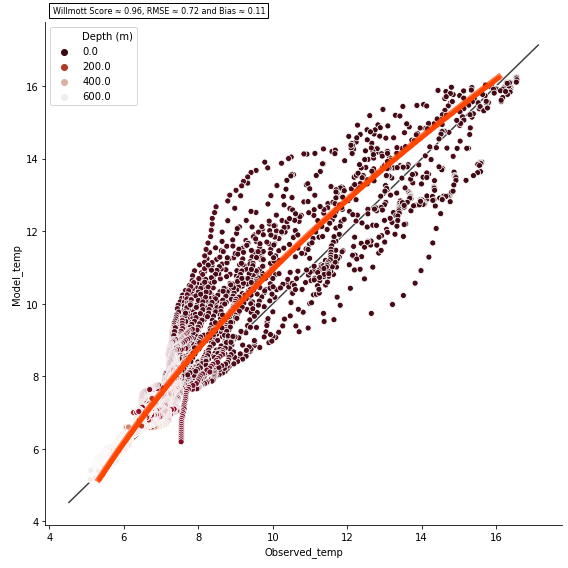

In [72]:


print("Model vs Observed and Fitted Line")

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)



p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)
# q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
# g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
p.axes[0,0].plot(y_new, x_new, lw=6, c='orangered', marker='.', alpha=0.7)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(8,8))
gs = gridspec.GridSpec(1, 1)
mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)


Model vs Observed and Fitted Line p(x) = 0.02 * x**2 + 0.49*x + 2.16


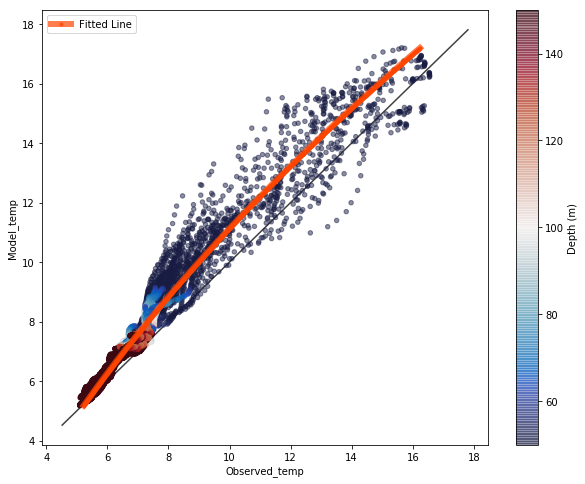

In [48]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.balance)

print("Model vs Observed and Fitted Line p(x) = {p0:.2f} * x**2 + {p1:.2f}*x + {p2:.2f}".format(p0 = z[0], p1 = z[1], p2 = z[2]))

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, ax = plt.subplots(1,1, figsize=(10,8))

df.plot.scatter(x="Observed_temp", y="Model_temp", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
ax.plot(y_new, x_new, lw=6, c='orangered', marker='.', alpha=0.7, label = 'Fitted Line')
ax.legend()
# gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
# anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
#                        bbox_to_anchor=(0., 1.),
#                        bbox_transform=ax.transAxes
#                        )
# ax.add_artist(anchored_text)

# ax.set_xlabel('Observed_temp')

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
# gs = gridspec.GridSpec(1, 1)
# mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()


Model vs Observed and Fitted Line p(x) = 0.03 * x**2 + 0.31*x + 2.91


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


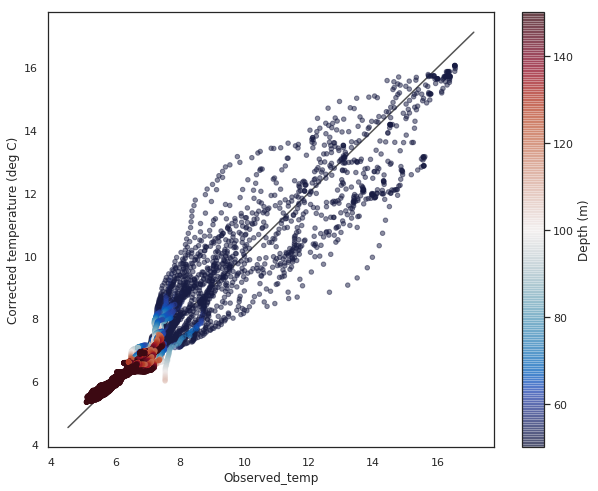

In [193]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.balance)

print("Model vs Observed and Fitted Line p(x) = {p0:.2f} * x**2 + {p1:.2f}*x + {p2:.2f}".format(p0 = z[0], p1 = z[1], p2 = z[2]))

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, ax = plt.subplots(1,1, figsize=(10,8))

df.plot.scatter(x="Observed_temp", y="Corrected temperature (deg C)", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# ax.plot(y_new, x_new, lw=6, c='orangered', marker='.', alpha=0.7, label = 'Fitted Line')
ax.legend()
# gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
# anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
#                        bbox_to_anchor=(0., 1.),
#                        bbox_transform=ax.transAxes
#                        )
# ax.add_artist(anchored_text)

# ax.set_xlabel('Observed_temp')

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
# gs = gridspec.GridSpec(1, 1)
# mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()


Model vs Observed and Fitted Line p(x) = 0.03 * x**2 + 0.31*x + 2.91


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


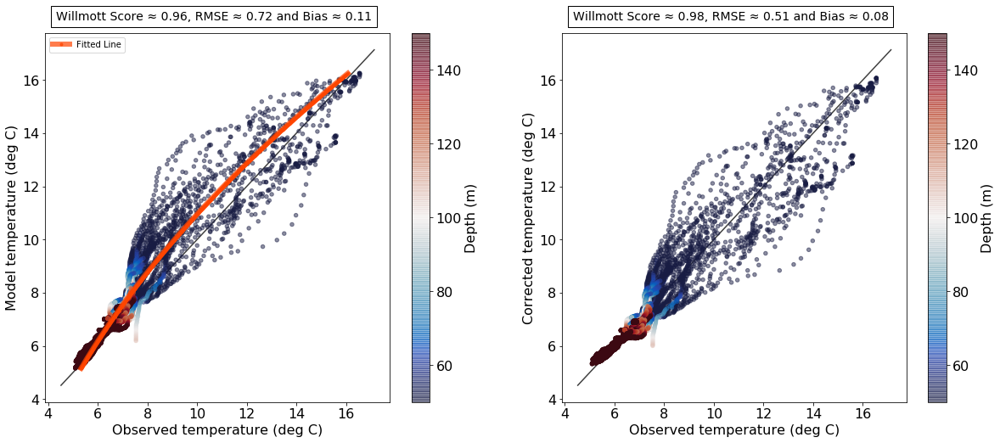

In [96]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.balance)

print("Model vs Observed and Fitted Line p(x) = {p0:.2f} * x**2 + {p1:.2f}*x + {p2:.2f}".format(p0 = z[0], p1 = z[1], p2 = z[2]))

# df =pd.DataFrame()
df['Observed temperature (deg C)'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model temperature (deg C)'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, (ax1,ax) = plt.subplots(1,2, figsize=(20,8))

g = df.plot.scatter(x="Observed temperature (deg C)", y="Corrected temperature (deg C)", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

g.figure.axes[-1].yaxis.label.set_size(16)
g.figure.axes[-1].tick_params(labelsize=16) 

lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
gamma2,rms_error,ws = get_stat_tem(df['Observed temperature (deg C)'], df['Corrected temperature (deg C)'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=14), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax.transAxes
                       )
ax.add_artist(anchored_text)

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# ax.plot(y_new, x_new, lw=6, c='orangered', marker='.', alpha=0.7, label = 'Fitted Line')
ax.legend()
ax.tick_params(axis='both',labelsize =16)
ax.set_xlabel('Observed temperature (deg C)', fontsize = 16)
ax.set_ylabel('Corrected temperature (deg C)', fontsize = 16)


q = df.plot.scatter(x="Observed temperature (deg C)", y="Model temperature (deg C)", c = "Depth (m)", ax = ax1, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
    np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=14), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax1.transAxes
                       )
ax1.add_artist(anchored_text)
ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
ax1.plot(y_new, x_new, lw=6, c='orangered', marker='.', alpha=0.7, label = 'Fitted Line')
ax1.legend()

ax1.tick_params(axis='both',labelsize =16)
ax1.set_xlabel('Observed temperature (deg C)', fontsize = 16)
ax1.set_ylabel('Model temperature (deg C)', fontsize = 16)

q.figure.axes[-1].yaxis.label.set_size(16)
q.figure.axes[-1].tick_params(labelsize=16) 

plt.savefig(path_to_save+'fit_temp.png')

In [35]:
# calculate polynomial
z_func = np.polyfit(df['Depth (m)'],df['Fitted_temp'], 2)
func = np.poly1d(z_func)

# # calculate new x's and y's
# x_new = np.arange(np.min(df['Observed_temp']), np.max(df['Observed_temp']), 0.01)
# y_new = f(x_new)

# x_fit = df['Observed_temp']
# y_fit = f(x_fit)


# df['Fitted_temp'] = y_fit

In [36]:
func

poly1d([  3.71632470e-05,  -2.55345099e-02,   9.86545185e+00])

In [58]:
z[0]

-0.033476679332457494

In [68]:
z 

print("p(x) = {p0:.2f} * x**2 + {p1:.2f}*x + {p2:.2f}".format(p0 = z[0], p1 = z[1], p2 = z[2]))

p(x) = -0.03 * x**2 + 1.73*x + -2.87


Model vs Observed and Fitted Line


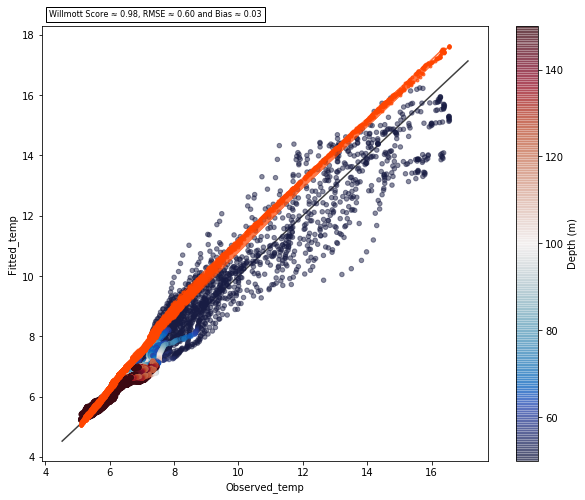

In [35]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.balance)

print("Model vs Observed and Fitted Line")

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, ax = plt.subplots(1,1, figsize=(10,8))

# ax.plot.scatter(x="Observed_temp", y="Changed_temp", lw=6, c='orangered', marker='.', alpha=0.7)
df.plot.scatter(x="Observed_temp", y="Fitted_temp", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
ax.plot(df['Observed_temp'], df['Changed_temp'], lw=1, c='orangered', marker='.', alpha=0.7)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Changed_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax.transAxes
                       )
ax.add_artist(anchored_text)

# ax.set_xlabel('Observed_temp')

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
# gs = gridspec.GridSpec(1, 1)
# mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()


Model vs Observed and Fitted Line


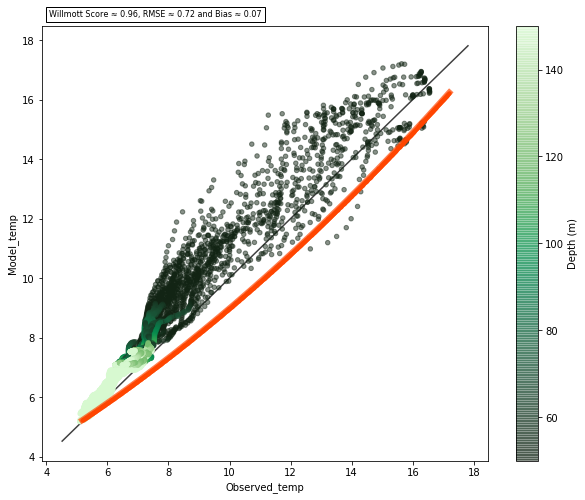

In [29]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.algae_r)

print("Model vs Observed and Fitted Line")

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, ax = plt.subplots(1,1, figsize=(10,8))

df.plot.scatter(x="Observed_temp", y="Model_temp", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
ax.plot(x_new, y_new, lw=6, c='orangered', marker='.', alpha=0.7)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Model_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax.transAxes
                       )
ax.add_artist(anchored_text)

# ax.set_xlabel('Observed_temp')

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
# gs = gridspec.GridSpec(1, 1)
# mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()


Model vs Observed


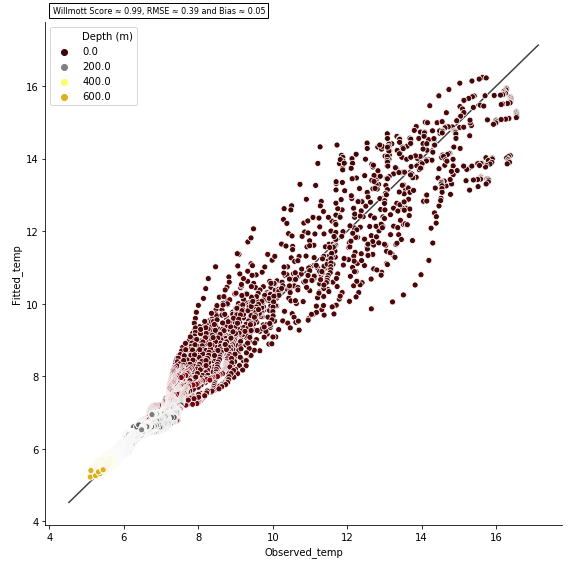

In [25]:


print("Model vs Observed")

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)

p = sns.relplot(x="Observed_temp", y="Fitted_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.oxy)
# q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
# g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# p.axes[0,0].plot(x_new, y_new, lw=6, c='orangered', marker='.', alpha=0.7)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Fitted_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(8,8))
gs = gridspec.GridSpec(1, 1)
mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)


In [28]:
df['Difference'] = np.empty_like(df['Observed_temp'])
df['Changed_temp'] = np.empty_like(df['Observed_temp'])

for i in np.arange(df['Observed_temp'].shape[0]):
    df['Difference'][i] = df['Fitted_temp'][i] - df['Observed_temp'][i]
    df['Changed_temp'][i] = df['Model_temp'][i] - df['Difference'][i]

15.810073

In [31]:
# calculate polynomial
z_func = np.polyfit(df['Depth (m)'], df['Difference'], 2)
f_func = np.poly1d(z_func)

# calculate new x's and y's
# x_new = np.arange(np.min(df['Observed_temp']), np.max(df['Observed_temp']), 0.01)
# y_new = f(x_new)

# x_fit = df['Difference']
# y_fit = f(x_fit)


# df['Fitted_temp'] = y_fit

In [119]:
z_func

array([  8.67185116e-07,  -2.01756368e-03,   8.58597416e-01])

In [120]:
f_func

poly1d([  8.67185116e-07,  -2.01756368e-03,   8.58597416e-01])

In [121]:
diff_value = f_func(zlevels[:])

In [122]:
diff_value

array([ 0.85760087,  0.85548961,  0.85326564,  0.85090399,  0.84837413,
        0.84563899,  0.84265351,  0.83936274,  0.83569986,  0.83158386,
        0.82691634,  0.82157809,  0.81542498,  0.80828297,  0.79994261,
        0.79015255,  0.7786122 ,  0.76496416,  0.74878603,  0.72958243,
        0.70677853,  0.67971563,  0.64765292,  0.60977644,  0.56522208,
        0.51311886,  0.45266107,  0.38322139,  0.30451858,  0.21685541,
        0.12144083,  0.0208081 ], dtype=float32)

In [123]:
lon.shape

(170, 170)

In [130]:
spic_mean_model[20,...]

array([[ -0.83393812,  -0.82703084,  -0.82062495, ..., -24.26027107,
        -24.26027107, -24.26027107],
       [ -0.84017473,  -0.83333135,  -0.8270632 , ..., -24.26027107,
        -24.26027107, -24.26027107],
       [ -0.84680724,  -0.83984089,  -0.83355492, ..., -24.26027107,
        -24.26027107, -24.26027107],
       ..., 
       [ -0.84394145,  -0.84114254,  -0.83688831, ...,  -1.77588165,
        -24.26027107, -24.26027107],
       [ -0.85248423,  -0.85191089,  -0.8493253 , ..., -24.26027107,
        -24.26027107, -24.26027107],
       [ -0.85904473,  -0.86039078,  -0.85935718, ..., -24.26027107,
        -24.26027107, -24.26027107]], dtype=float32)

In [131]:
CT_mean_model[20,...]

array([[ 7.89714575,  7.92401266,  7.9501915 , ..., -0.73199922,
        -0.73199922, -0.73199922],
       [ 7.86809301,  7.89325762,  7.9177947 , ..., -0.73199922,
        -0.73199922, -0.73199922],
       [ 7.83893919,  7.86307812,  7.88642454, ..., -0.73199922,
        -0.73199922, -0.73199922],
       ..., 
       [ 7.1812892 ,  7.16383314,  7.15187502, ...,  8.41486931,
        -0.73199922, -0.73199922],
       [ 7.20970488,  7.19063377,  7.17776585, ..., -0.73199922,
        -0.73199922, -0.73199922],
       [ 7.2400918 ,  7.21868324,  7.20509243, ..., -0.73199922,
        -0.73199922, -0.73199922]], dtype=float32)

In [129]:
changed_temp_mean[20,...]

array([[ 7.8666935 ,  7.8935442 ,  7.91970062, ..., -0.70677853,
        -0.70677853, -0.70677853],
       [ 7.83768368,  7.86284065,  7.88736248, ..., -0.70677853,
        -0.70677853, -0.70677853],
       [ 7.80856514,  7.8327055 ,  7.85604382, ..., -0.70677853,
        -0.70677853, -0.70677853],
       ..., 
       [ 7.15468359,  7.13737631,  7.12556505, ...,  8.36083984,
        -0.70677853, -0.70677853],
       [ 7.18277788,  7.16382122,  7.15107346, ..., -0.70677853,
        -0.70677853, -0.70677853],
       [ 7.2128706 ,  7.19155216,  7.17805529, ..., -0.70677853,
        -0.70677853, -0.70677853]], dtype=float32)

In [111]:
diff_value[20]

-71.051384

In [89]:
np.mean(diff_value[20,...])

-71.051384

In [ ]:


# diff_value = np.empty_like(temp)
changed_temp_mean = np.empty_like(temp)
pressure_mean = gsw.p_from_z(-zlevels[:],np.mean(lat))
SA_mean_model = np.empty_like(temp)
CT_mean_model = np.empty_like(temp)
spic_mean_model = np.empty_like(temp)


for t in time_location:
    for j in np.arange(temp.shape[2]):
        for i in np.arange(temp.shape[3]):
            for k in np.arange(temp.shape[1]):
#                 diff_value[t,k,j,i] = f_func(zlevels[k])
#                 changed_temp_mean[t,k,j,i] = temp[t,k,j,i] - diff_value[t,k,j,i]
                changed_temp_mean[t,k,j,i] = f(temp[t,k,j,i])
                SA_mean_model[t,k,j,i] = gsw.SA_from_SP(sal[t,k,j,i], pressure_mean[k], lon[j,i], lat[j,i])
                CT_mean_model[t,k,j,i] = gsw.CT_from_pt(sal[t,k,j,i], changed_temp_mean[t,k,j,i])
                spic_mean_model[t,k,j,i] = gsw.spiciness0(SA_mean_model[t,k,j,i],CT_mean_model[t,k,j,i])
            
            
            

In [48]:
SA_mean_model.shape

(180, 32, 170, 170)

In [33]:
def plot_spic_subplot_changed(level, ax, cmin, cmax):
    
    import matplotlib as mpl
    norm = mpl.colors.Normalize(vmin=cmin,vmax=-cmax)

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']

    y_wcvi_slice = np.array(np.arange(180,350))
    x_wcvi_slice = np.array(np.arange(480,650))

    arrow_step = 7
    y_slice_a = y_wcvi_slice[::arrow_step]
    x_slice_a = x_wcvi_slice[::arrow_step]



    lon = bathy['nav_lon'][180:350, 480:650]
    lat = bathy['nav_lat'][180:350, 480:650]

    lon_model = bathy['nav_lon'][...]
    lat_model = bathy['nav_lat'][...]

    y = np.empty_like(lat_location)
    x = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        y[i], x[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon_model,lat_model,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

    n = np.empty_like(lat_location)
    m = np.empty_like(lat_location)


    for i in np.arange(lat_location.shape[0]):
        n[i], m[i] = geo_tools.find_closest_model_point(
                   lon_location[i],lat_location[i],lon,lat,tols={
            'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})


    spic_tzyx = spic_mean_model[level,...]
    spic_tzyx = np.ma.masked_array(spic_tzyx, mask= 1- tmask[level,...])

#     tra_tzyx = tracer_mean[level,...]
#     tra_tzyx = np.ma.masked_array(tra_tzyx, mask= 1- tmask[level,...])


    viz_tools.set_aspect(ax)
    cmap = plt.get_cmap(cmo.cm.balance)
    cmap.set_bad('burlywood')
    mesh = ax.pcolormesh(x_wcvi_slice,y_wcvi_slice, spic_tzyx, cmap=cmap, norm = norm, vmin = cmin, vmax = cmax)

    value = zlevels[level]
    tol = 0.5
    for file_number in np.arange(len(file)):
        for i in np.arange(z_location[file_number].shape[0]):
            idx = (z_location[file_number][i] <= value+tol ) & (z_location[file_number][i] >= value-tol)
            if idx == True:
                spic_falkor_depth = spic_falk_loc[file_number][i]
                ax.scatter(x[file_number], y[file_number], c = spic_falkor_depth, norm = norm, cmap = cmap, vmin = cmin, vmax= cmax, s=500, alpha=0.5,edgecolor= 'cyan' )#, label = 'Closest Falkor Points')


#     u_tzyx, v_tzyx = viz_tools.unstagger(u_mean[level,...], v_mean[level,...])
#     u_tzyx = np.ma.masked_array(u_tzyx, mask= 1- umask[level,1:,1:,])
#     v_tzyx = np.ma.masked_array(v_tzyx, mask= 1- vmask[level,1:,1:])
#     speeds = np.sqrt(np.square(u_tzyx) + np.square(v_tzyx))
#     quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_tzyx[::arrow_step,::arrow_step], v_tzyx[::arrow_step,::arrow_step] , speeds[::arrow_step, ::arrow_step], pivot='mid', cmap=cmap, width=0.005, minshaft= 0.5)
    ax.set_xlabel('x Index',fontsize=18)
    ax.set_ylabel('y Index',fontsize=18)
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], levels =[0,10,20,30,40,50, 100, 200, 500], colors = 'white')
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=18, color = 'white')
    


    ax.set_title('depth \u2248 {d:.2f} m'.format(d=zlevels[level], z=zlevels),fontsize=18)
    legend = ax.legend(loc='best', fancybox=True, framealpha=0.25)
    ax.grid()
    return ax, mesh


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


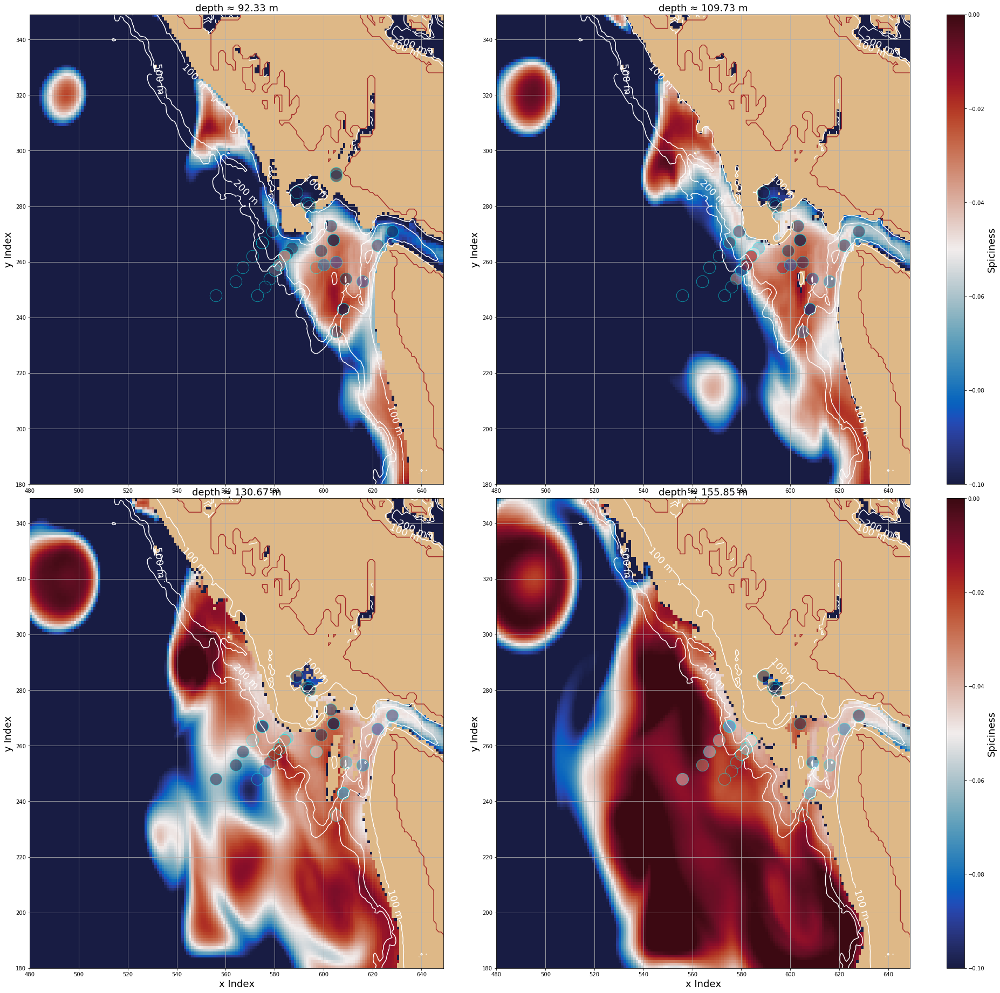

In [127]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 21, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 22, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot(level= 23, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 24, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


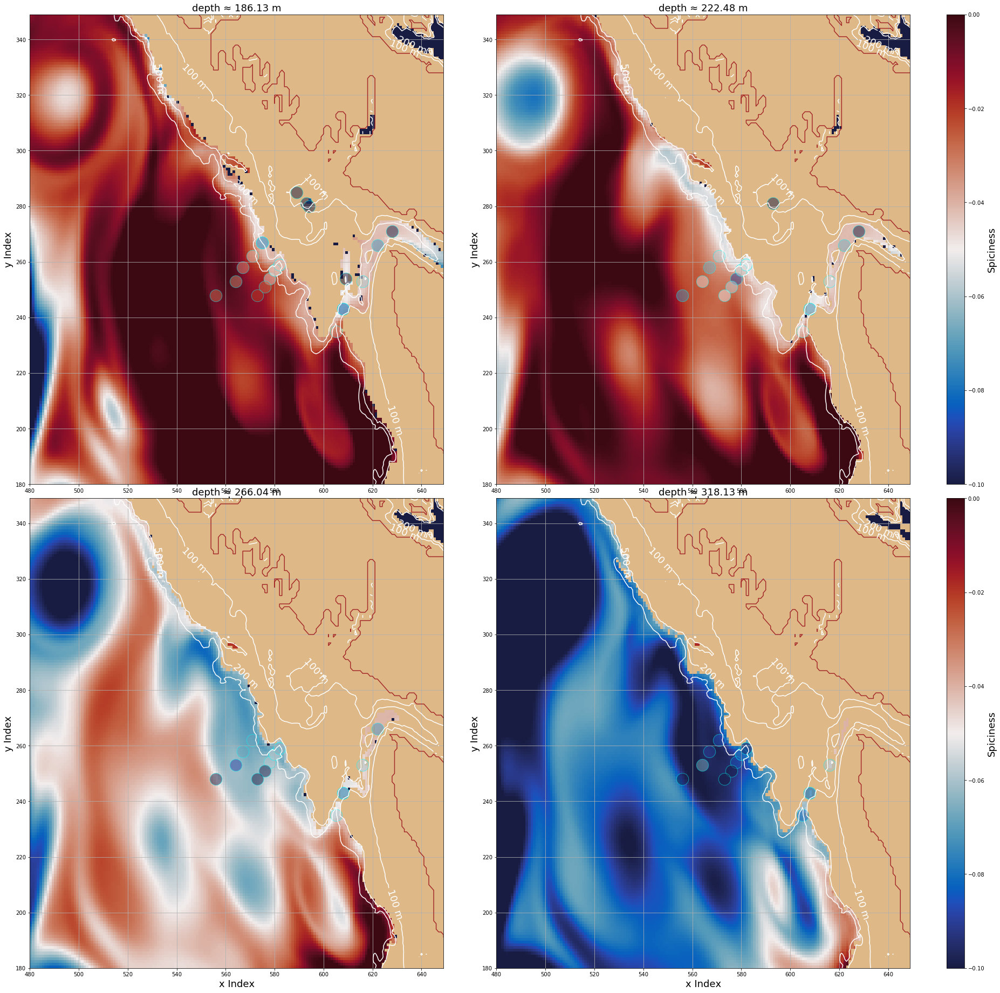

In [133]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot(level= 25, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot(level= 26, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot(level= 27, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot(level= 28, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


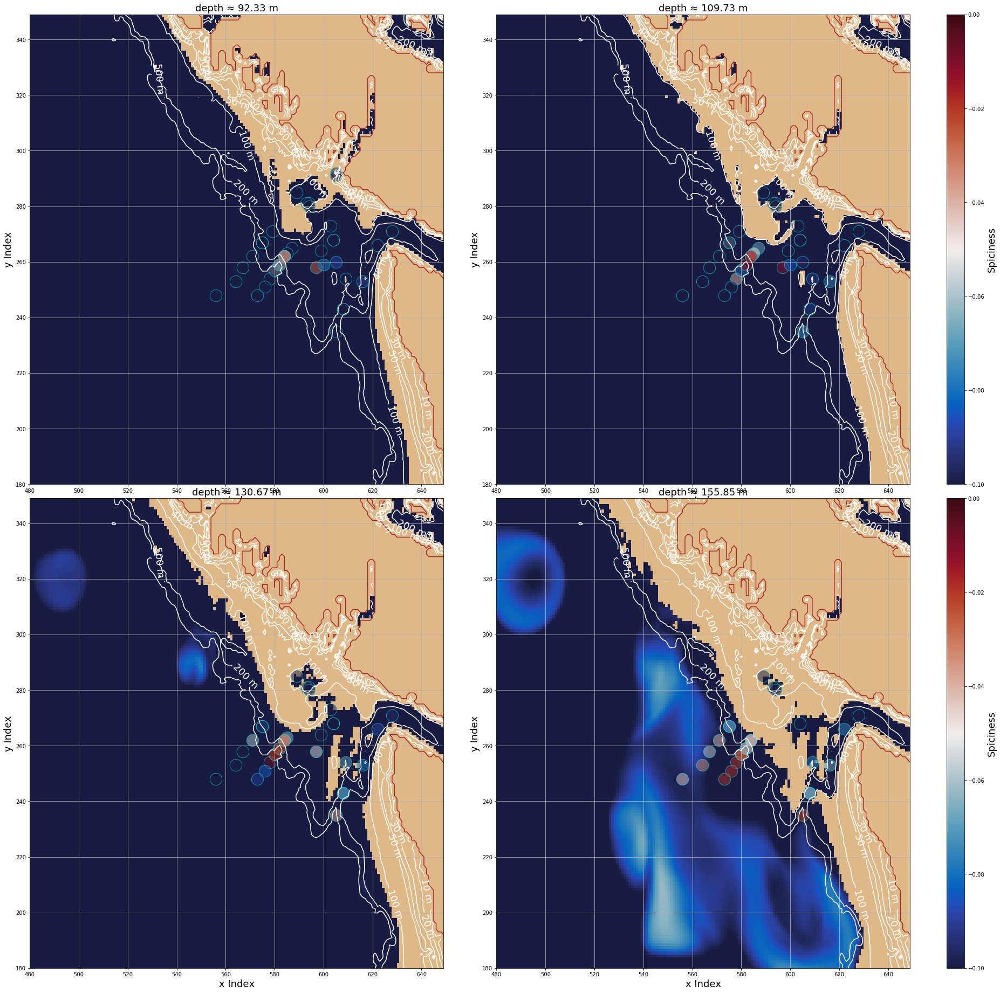

In [128]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot_changed(level= 21, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot_changed(level= 22, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot_changed(level= 23, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot_changed(level= 24, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


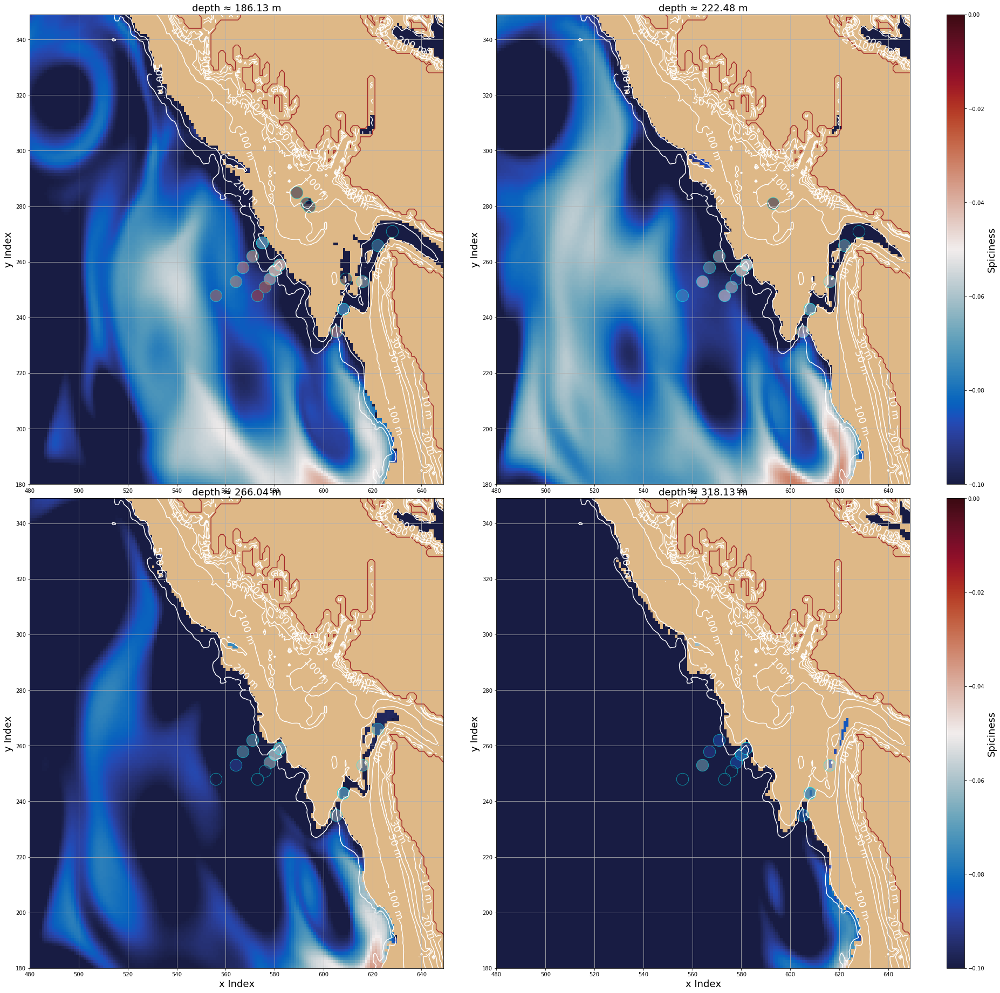

In [132]:
fig, axs = plt.subplots(2, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 1]})

fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)

axs[0,0], mesh = plot_spic_subplot_changed(level= 25, ax= axs[0,0], cmin = -0.1, cmax = 0)
axs[0,1], mesh = plot_spic_subplot_changed(level= 26, ax= axs[0,1], cmin = -0.1, cmax = 0)

cbar = fig.colorbar(mesh, cax=axs[0,2])
cbar.set_label(label='Spiciness', fontsize = 18)

axs[1,0], mesh = plot_spic_subplot_changed(level= 27, ax= axs[1,0], cmin = -0.1, cmax = 0)
axs[1,1], mesh = plot_spic_subplot_changed(level= 28, ax= axs[1,1], cmin = -0.1, cmax = 0)

cbar = plt.colorbar(mesh, cax=axs[1,2])
cbar.set_label(label='Spiciness', fontsize = 18)

In [72]:
np.nanmean(spic_mean_model[20,...])

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:1: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


nan

In [71]:
spic_mean_model.shapeape

(32, 170, 170)

In [54]:
changed_temp_mean.shape

(32, 170, 170)

In [49]:
diff_value.shape

(32,)

Model vs Observed


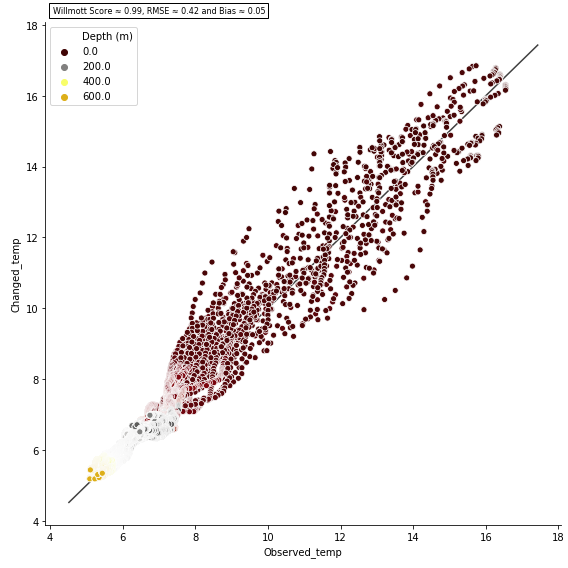

In [40]:


print("Model vs Observed")

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed_Spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model_Spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)

p = sns.relplot(x="Observed_temp", y="Changed_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.oxy)
# q = sns.relplot(x="Observed_Salinity", y="Model_Salinity", hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
# g = sns.relplot(x='Observed_Spice', y='Model_Spice', hue="Depth (m)",  sizes=(40, 400),data=df, palette=cmo.cm.oxy)#, palette=cmap)
leg = p.axes[0, 0].get_legend()
p.axes[0,0].legend(loc="best")

lims = [
    np.min([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # min of both axes
    np.max([p.axes[0,0].get_xlim(), p.axes[0,0].get_ylim()]),  # max of both axes
]

p.axes[0,0].plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# p.axes[0,0].plot(x_new, y_new, lw=6, c='orangered', marker='.', alpha=0.7)
gamma2,rms_error,ws = get_stat_tem(df['Observed_temp'], df['Changed_temp'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=p.axes[0,0].transAxes
                       )
p.axes[0,0].add_artist(anchored_text)

lims = [
    np.min([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # min of both axes
    np.max([q.axes[0,0].get_xlim(), q.axes[0,0].get_ylim()]),  # max of both axes
]

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
fig = plt.figure(figsize=(8,8))
gs = gridspec.GridSpec(1, 1)
mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()
gs.tight_layout(fig)


In [58]:
df['Observed_temp'][0]

12.8195

In [45]:
z

array([-0.03347668,  1.73047271, -2.86575421])

1) Use Scipy optimise Curve fit to fit a curve

2) remove the bias by assuming the model values are offset by margin of the fitted function (make them as a function of z_depth or not optional mostly not) and then recalculate the bias and the skill scores for the variables and see how they change and if they make a difference for bin_2

In [3]:
df['Observed_temp'].iloc[-1]

NameError: name 'df' is not defined

In [39]:
df['Observed_temp'].shape

(10336,)

In [90]:
pressure_loc = gsw.p_from_z(-df["Depth (m)"][:],np.mean(lat_wcvi))
SA_loc = np.empty_like(df['Observed temperature (deg C)'])
spic = np.empty_like(df['Observed temperature (deg C)'])
CT_loc= np.empty_like(df['Observed temperature (deg C)'])


for i in np.arange(df['Observed temperature (deg C)'].shape[0]):
    SA_loc[i] = gsw.SA_from_SP(df['Observed_Salinity'][i], pressure_loc[i], np.mean(lon_wcvi), np.mean(lat_wcvi))
    CT_loc[i] = gsw.CT_from_pt(df['Observed_Salinity'][i], df['Corrected temperature (deg C)'][i])
    spic[i] = gsw.spiciness0(SA_loc[i],CT_loc[i])
    
df['Corrected spice'] = spic

Model vs Observed and Fitted Line


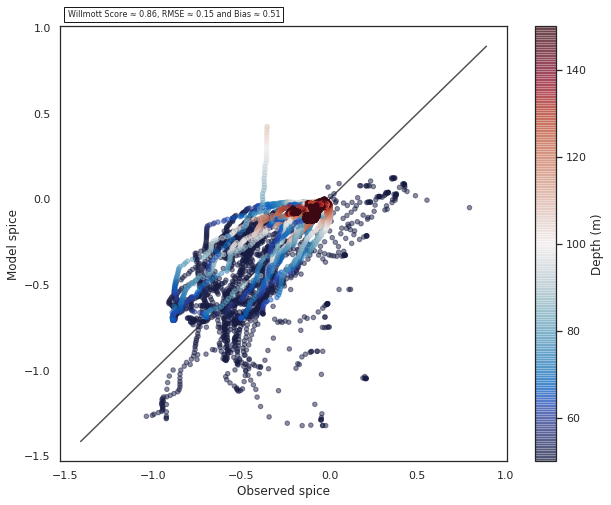

In [206]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.balance)

print("Model vs Observed and Fitted Line")

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, ax = plt.subplots(1,1, figsize=(10,8))

df.plot.scatter(x="Observed spice", y="Model spice", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# ax.plot(x_new, y_new, lw=6, c='orangered', marker='.', alpha=0.7)
gamma2,rms_error,ws = get_stat_tem(df['Observed spice'], df['Model spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax.transAxes
                       )
ax.add_artist(anchored_text)

# ax.set_xlabel('Observed_temp')

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
# gs = gridspec.GridSpec(1, 1)
# mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()


Model vs Observed and Fitted Line


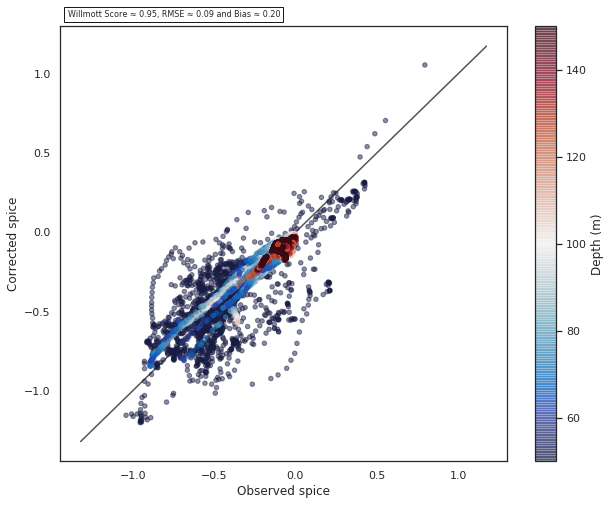

In [207]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.balance)

print("Model vs Observed and Fitted Line")

# df =pd.DataFrame()
df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)


# Depths = np.empty_like(z_bin_2)
# Depths[np.where((75>z_bin_2) & (z_bin_2>=50))] = 0
# Depths[np.where((100>z_bin_2) & (z_bin_2>=75))] = 1 
# df['Z'] = Depths

df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, ax = plt.subplots(1,1, figsize=(10,8))

df.plot.scatter(x="Observed spice", y='Corrected spice', c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# ax.plot(x_new, y_new, lw=6, c='orangered', marker='.', alpha=0.7)
gamma2,rms_error,ws = get_stat_tem(df['Observed spice'], df['Corrected spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=8), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax.transAxes
                       )
ax.add_artist(anchored_text)

# ax.set_xlabel('Observed_temp')

# fig, axs = plt.subplots(1, 3, figsize=(25, 25), gridspec_kw={'width_ratios': [25, 25, 25]})

# fig.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
# gs = gridspec.GridSpec(1, 1)
# mg0 = SeabornFig2Grid(p, fig, gs[0])
# mg1 = SeabornFig2Grid(q, fig, gs[1])
# mg2 = SeabornFig2Grid(g, fig, gs[2])

# mg3 = SeabornFig2Grid(p, fig, gs[3])

# plt.show()


Model vs Observed and Fitted Line p(x) = 0.03 * x**2 + 0.31*x + 2.91


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


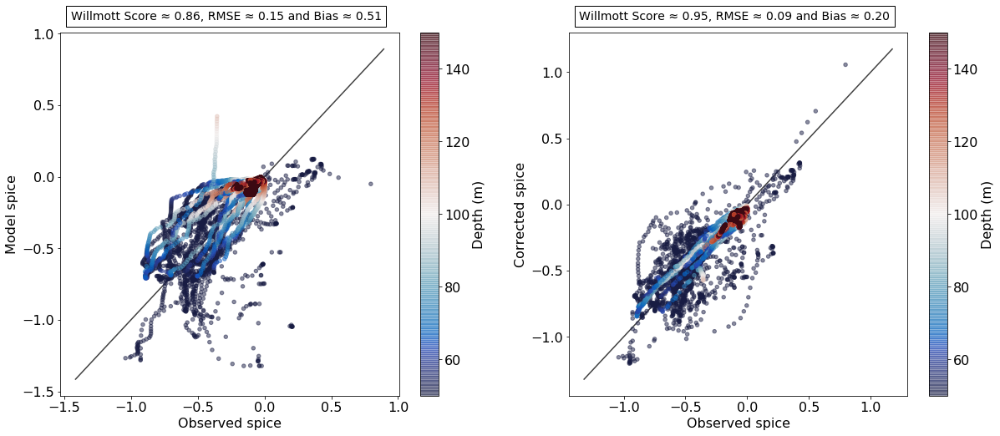

In [95]:
cmin = 50
cmax = 150



import matplotlib as mpl
norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)
cmap = plt.get_cmap(cmo.cm.balance)

print("Model vs Observed and Fitted Line p(x) = {p0:.2f} * x**2 + {p1:.2f}*x + {p2:.2f}".format(p0 = z[0], p1 = z[1], p2 = z[2]))

df['Observed_temp'] = np.concatenate((tem_bin_1, tem_bin_2, tem_bin_3), axis = 0)
df['Model_temp'] = np.concatenate((tem_bin_1_m, tem_bin_2_m, tem_bin_3_m), axis = 0)
df['Observed_Salinity'] = np.concatenate((sal_bin_1, sal_bin_2, sal_bin_3), axis = 0)
df['Model_Salinity'] = np.concatenate((sal_bin_1_m, sal_bin_2_m, sal_bin_3_m), axis = 0)
df['Observed spice'] = np.concatenate((spic_bin_1, spic_bin_2, spic_bin_3), axis = 0)
df['Model spice'] = np.concatenate((spic_bin_1_m, spic_bin_2_m, spic_bin_3_m), axis = 0)
df["Depth (m)"] = np.concatenate((z_bin_1[:], z_bin_2[:], z_bin_3[:]), axis = 0)


fig, (ax1,ax) = plt.subplots(1,2, figsize=(20,8))

g = df.plot.scatter(x="Observed spice", y="Corrected spice", c = "Depth (m)", ax = ax, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
gamma2,rms_error,ws = get_stat_tem(df['Observed spice'], df['Corrected spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=14), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax.transAxes
                       )
ax.add_artist(anchored_text)

ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# ax.plot(y_new, x_new, lw=6, c='orangered', marker='.', alpha=0.7, label = 'Fitted Line')
ax.legend()
ax.tick_params(axis='both',labelsize =16)
ax.set_xlabel('Observed spice', fontsize = 16)
ax.set_ylabel('Corrected spice', fontsize = 16)

g.figure.axes[-1].yaxis.label.set_size(16)
g.figure.axes[-1].tick_params(labelsize=16) 


q = df.plot.scatter(x="Observed spice", y="Model spice", c = "Depth (m)", ax = ax1, norm = norm, cmap = cmap, vmin = cmin, vmax = cmax, alpha = 0.5)
# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)


lims = [
    np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
    np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]
gamma2,rms_error,ws = get_stat_tem(df['Observed spice'], df['Model spice'], df["Depth (m)"])
anchored_text = AnchoredText("Willmott Score \u2248 {w:.2f}, RMSE \u2248 {r:.2f} and Bias \u2248 {b:.2f}". format(w = ws, r = rms_error, b = gamma2),prop=dict(size=14), loc=3, frameon=True,
                       bbox_to_anchor=(0., 1.),
                       bbox_transform=ax1.transAxes
                       )
ax1.add_artist(anchored_text)
ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
# ax1.plot(y_new, x_new, lw=6, c='orangered', marker='.', alpha=0.7, label = 'Fitted Line')
ax1.legend()


ax1.tick_params(axis='both',labelsize =16)
ax1.set_xlabel('Observed spice', fontsize = 16)
ax1.set_ylabel('Model spice', fontsize = 16)

q.figure.axes[-1].yaxis.label.set_size(16)
q.figure.axes[-1].tick_params(labelsize=16) 

plt.savefig(path_to_save+'spice_fit.png')

## As can be seen all the deeper spice values now has a better agreement with the model observations

In [195]:
def add_changed_model_data_to_bin_at_station_locations(file_number, z_bin_1, z_bin_2, z_bin_3,\
                    tem_bin_1, tem_bin_2, tem_bin_3, \
                   sal_bin_1, sal_bin_2, sal_bin_3, \
                   spic_bin_1, spic_bin_2, spic_bin_3):
    
    t = time_location[file_number]
    j = n[file_number]
    i = m[file_number]
        
    model_temp_ini = temp[t,:mbathy[j,i],j,i]
    model_temp = model_temp_ini[np.nonzero(model_temp_ini)]
#     model_temp = np.ma.masked_array(model_temp_ini, mask= 1- tmask[:mbathy[j,i],j,i])

    model_sal_ini = sal[t,:mbathy[j,i],j,i]
    model_sal = model_sal_ini[np.nonzero(model_sal_ini)]

    model_spice_ini = spic_mean_model[t,:mbathy[j,i],j,i]
    model_spice = model_spice_ini[np.nonzero(model_sal_ini)]

    

    z_obs = np.array(z_location[file_number])

    
    
    
    func_temp = interp1d(zlevels[:model_temp.shape[0]], model_temp, fill_value='extrapolate')
    model_temp_interp = func_temp(z_obs)
    
    
    func_sal = interp1d(zlevels[:model_sal.shape[0]], model_sal, fill_value='extrapolate')
    model_sal_interp = func_sal(z_obs)
    
    func_spic = interp1d(zlevels[:model_spice.shape[0]], model_spice, fill_value='extrapolate')
    model_spice_interp = func_spic(z_obs)
    
        
    
    
       
    z_data_bin_1    = z_obs[np.where(z_obs < 60)]

    tem_data_bin_1  = model_temp_interp[np.where(z_obs < 60)]

    sal_data_bin_1  = model_sal_interp[np.where(z_obs < 60)]

    spic_data_bin_1 = model_spice_interp[np.where(z_obs < 60)]
    

    z_data_bin_2    = z_obs[np.where((z_obs >= 60) & (z_obs < 120))]

    tem_data_bin_2  = model_temp_interp[np.where((z_obs >= 60) & (z_obs < 120))]

    sal_data_bin_2  = model_sal_interp[np.where((z_obs >= 60) & (z_obs < 120))]

    spic_data_bin_2 = model_spice_interp[np.where((z_obs >= 60) & (z_obs < 120))]
    

    z_data_bin_3    = z_obs[np.where((z_obs >= 120)& (z_obs <=500))]

    tem_data_bin_3  = model_temp_interp[np.where((z_obs >= 120) & (z_obs <500))]

    sal_data_bin_3  = model_sal_interp[np.where((z_obs >= 120) & (z_obs <500))]

    spic_data_bin_3 = model_spice_interp[np.where((z_obs >= 120) & (z_obs <500))]
    
    
    z_bin_1 = np.append(arr= z_bin_1, values= z_data_bin_1)
    z_bin_2 = np.append(arr= z_bin_2, values= z_data_bin_2)
    z_bin_3 = np.append(arr= z_bin_3, values= z_data_bin_3)
    
    tem_bin_1 = np.append(arr= tem_bin_1, values= tem_data_bin_1)
    tem_bin_2 = np.append(arr= tem_bin_2, values= tem_data_bin_2)
    tem_bin_3 = np.append(arr= tem_bin_3, values= tem_data_bin_3)
    
    sal_bin_1 = np.append(arr= sal_bin_1, values= sal_data_bin_1)
    sal_bin_2 = np.append(arr= sal_bin_2, values= sal_data_bin_2)
    sal_bin_3 = np.append(arr= sal_bin_3, values= sal_data_bin_3)
    
    spic_bin_1 = np.append(arr= spic_bin_1, values= spic_data_bin_1)
    spic_bin_2 = np.append(arr= spic_bin_2, values= spic_data_bin_2)
    spic_bin_3 = np.append(arr= spic_bin_3, values= spic_data_bin_3)
    
    return z_bin_1, z_bin_2, z_bin_3, tem_bin_1, tem_bin_2, tem_bin_3, sal_bin_1, sal_bin_2, sal_bin_3, spic_bin_1, spic_bin_2, spic_bin_3
    

    
    
    
    
    

In [196]:
z_bin_1_m = []
z_bin_2_m = []
z_bin_3_m = []

tem_bin_1_m = []
tem_bin_2_m = []
tem_bin_3_m = []

sal_bin_1_m = []
sal_bin_2_m = []
sal_bin_3_m = []

spic_bin_1_m = []
spic_bin_2_m = []
spic_bin_3_m = []


for file_number in np.arange(1,len(file)-1):
    if file_number!=23:
        z_bin_1_m, z_bin_2_m, z_bin_3_m, \
        tem_bin_1_m, tem_bin_2_m,tem_bin_3_m, \
        sal_bin_1_m, sal_bin_2_m, sal_bin_3_m, \
        spic_bin_1_m, spic_bin_2_m, spic_bin_3_m = add_changed_model_data_to_bin_at_station_locations(file_number, z_bin_1_m, z_bin_2_m, z_bin_3_m,\
                                                             tem_bin_1_m, tem_bin_2_m, tem_bin_3_m, \
                                                             sal_bin_1_m, sal_bin_2_m, sal_bin_3_m, \
                                                             spic_bin_1_m, spic_bin_2_m, spic_bin_3_m)
    


NameError: name 'spic_mean_model' is not defined

#### Now plot the CTD casts at the isopycnal of 26.4

array([131, 131, 131, 132, 132, 132, 132, 132, 132, 132, 132, 132, 132,
       132, 133, 133, 133, 134, 134, 134, 134, 134, 134, 134, 135, 135,
       135, 136, 137, 138, 138, 138, 138, 139, 139, 139, 139, 139, 142])